                                                 STOCK PORTFOLIO RECOMMEDNATION

OBJECTIVE - A hybrid stock prediction model that combines AutoRegressive Integrated Moving Average (ARIMA) and Long Short-Term Memory (LSTM) networks, enhanced by key technical indicators for stock ranking and recommendation. The model leverages ARIMA for short-term stock price prediction and residual calculation, which are then used to train LSTM to capture non-linear trends. Technical indicators such as Simple Moving Average (SMA), Exponential Moving Average (EMA), Relative Strength Index (RSI), Moving Average Convergence Divergence (MACD), Bollinger Bands, Golden Cross, and Death Cross are applied to forecast stock movements and rank stocks for the next 30 days. By integrating ARIMA for linear dependencies and LSTM for non-linear complexities, the model improves predictive accuracy. Additionally, we analyze the impact of feature selection and market condition adaptability, demonstrating how profit potential calculations can optimize investment strategies. This integrated approach offers a robust stock ranking system and practical tool for investors

IMPORTING LIBRARIES

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
import numpy as np
from pmdarima import auto_arima
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.layers import LSTM, Dense, Dropout
import talib 
from statsmodels.tsa.arima.model import ARIMA
import plotly.express as px

LOADING THE HISTORICAL DATA (2015-2023)  OF STOCK SECTOR WISE  - IT, HEALTHCARE, BANKING

In [4]:
# Load the CSV files for IT sector
it_sector_wipro = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/WIPRO.NS.csv")
it_sector_coforge = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/COFORGE.NS.csv")
it_sector_persistent = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/PERSISTENT.NS.csv")
it_sector_hcltech = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/HCLTECH.NS.csv")
it_sector_techm = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/TECHM.NS.csv")
it_sector_tcn = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/TCS.NS.csv")
it_sector_sasken = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/SASKEN.NS.csv")

# Combine IT sector dataframes
it_sector = pd.concat([it_sector_wipro, it_sector_coforge, it_sector_persistent, 
                       it_sector_hcltech, it_sector_techm, it_sector_tcn, it_sector_sasken], ignore_index=True)

# Load the CSV files for Healthcare sector
healthcare_sector_auro = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/AUROPHARMA.NS.csv")
healthcare_sector_fortis = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/FORTIS.NS.csv")
healthcare_sector_alkem = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/ALKEM.NS.csv")
healthcare_sector_lupin = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/LUPIN.NS.csv")
healthcare_sector_ipca = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/IPCALAB.NS.csv")
healthcare_sector_zydus = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/ZYDUSLIFE.NS.csv")
healthcare_sector_drreddy = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/DRREDDY.NS.csv")
healthcare_sector_biocon = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/BIOCON.NS.csv")

# Combine Healthcare sector dataframes
healthcare_sector = pd.concat([healthcare_sector_auro, healthcare_sector_fortis, healthcare_sector_alkem, 
                               healthcare_sector_lupin, healthcare_sector_ipca, healthcare_sector_zydus, 
                               healthcare_sector_drreddy, healthcare_sector_biocon], ignore_index=True)

# Load the CSV files for Banking sector
banking_sector_idfc = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/IDFCFIRSTB.NS.csv")
banking_sector_lichsgfin = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/LICHSGFIN.NS.csv")
banking_sector_muthoot = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/MUTHOOTFIN.NS.csv")
banking_sector_cholafin = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/CHOLAFIN.NS.csv")
banking_sector_poonawalla = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/POONAWALLA.NS.csv")
banking_sector_recltd = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/RECLTD.NS.csv")
banking_sector_canfin = pd.read_csv("C:/Users/yashv/Desktop/PROJECT/stock_data/CANFINHOME.NS.csv")

# Combine Banking sector dataframes
banking_sector = pd.concat([banking_sector_idfc, banking_sector_lichsgfin, banking_sector_muthoot, 
                            banking_sector_cholafin, banking_sector_poonawalla, banking_sector_recltd, 
                            banking_sector_canfin], ignore_index=True)

# Add a new column to each dataframe to indicate the sector
it_sector['Sector'] = 'IT'
healthcare_sector['Sector'] = 'Healthcare'
banking_sector['Sector'] = 'Banking'

# Combine the three sector dataframes into a single dataframe
sector = pd.concat([it_sector, healthcare_sector, banking_sector], ignore_index=True)

# Display the first few rows to ensure data is combined
print("Combined Sector Data:")
print(sector.head())


Combined Sector Data:
       Date        Open        High         Low       Close   Adj Close  \
0  1/1/2015  207.206299  207.900055  206.437546  207.150055  194.484207   
1  1/2/2015  207.525055  210.093796  207.375046  208.987549  196.209366   
2  1/5/2015  208.893799  211.875046  208.312546  209.362549  196.561478   
3  1/6/2015  208.125046  208.650055  203.287552  204.468796  191.966888   
4  1/7/2015  203.700043  204.375046  201.881302  202.912552  190.505814   

    Volume Sector  
0   541274     IT  
1  2099476     IT  
2  1919300     IT  
3  6198347     IT  
4  4152790     IT  


CALCUATION OF TECHINCAL INDICTAORS

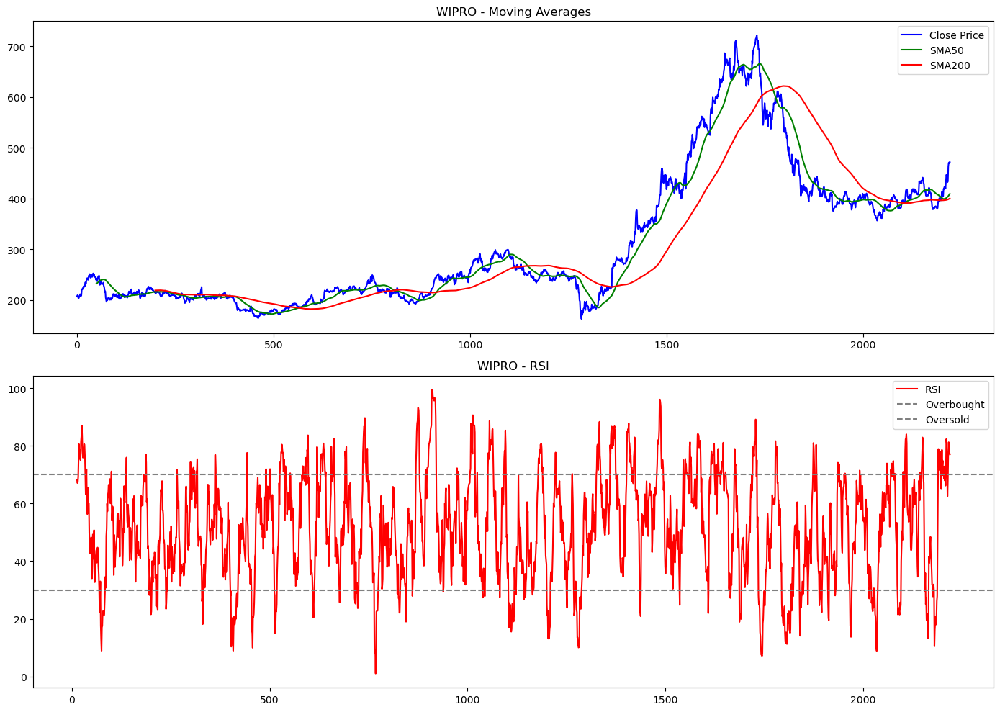

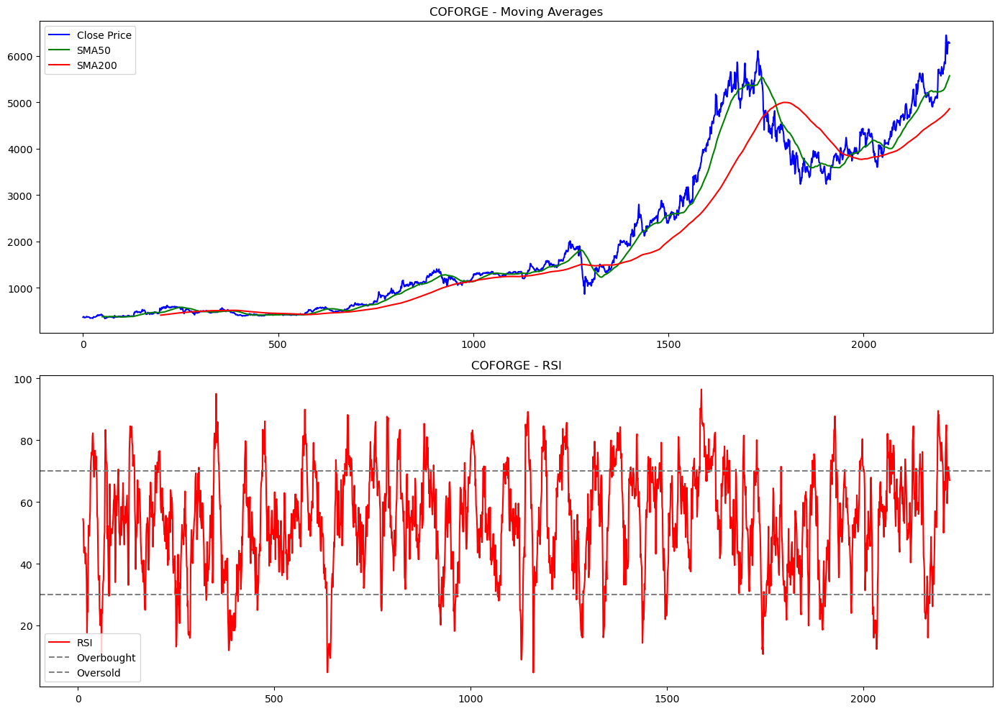

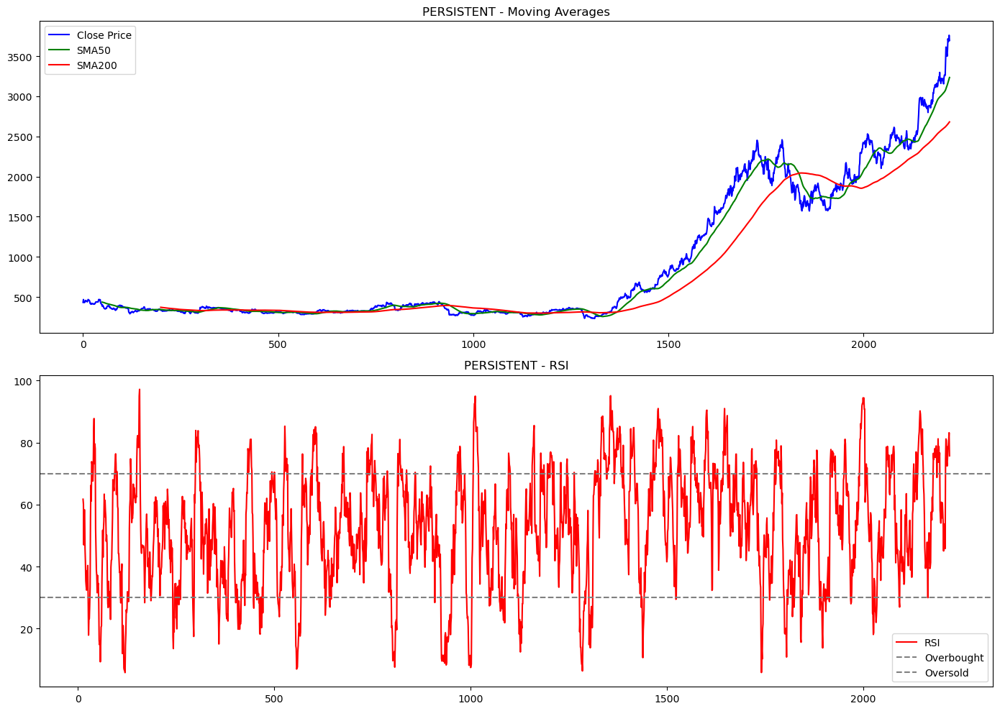

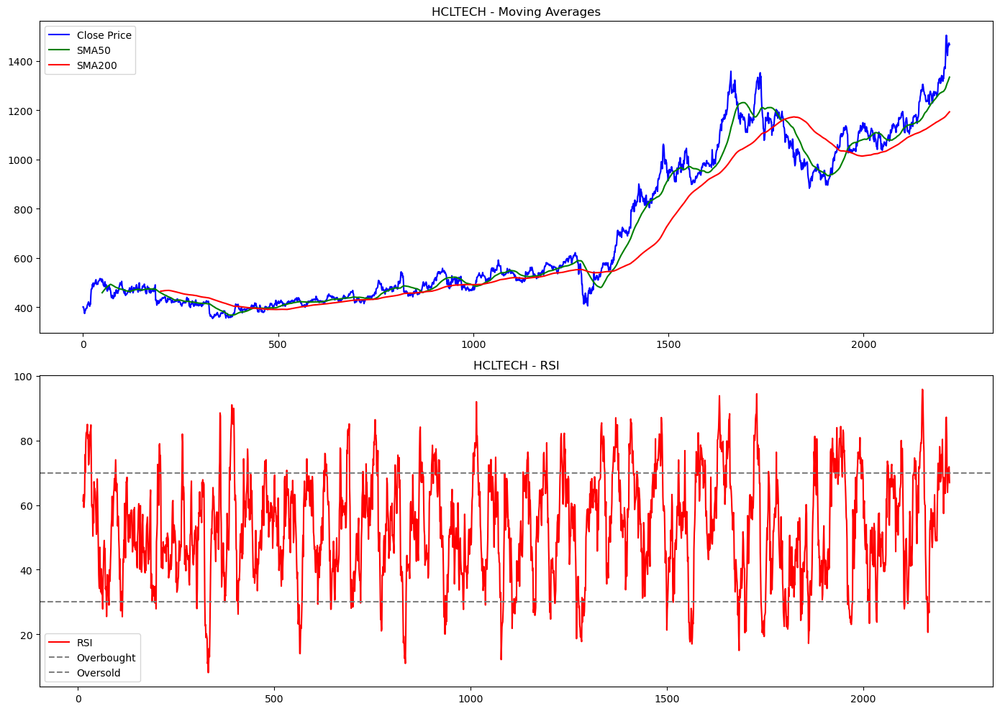

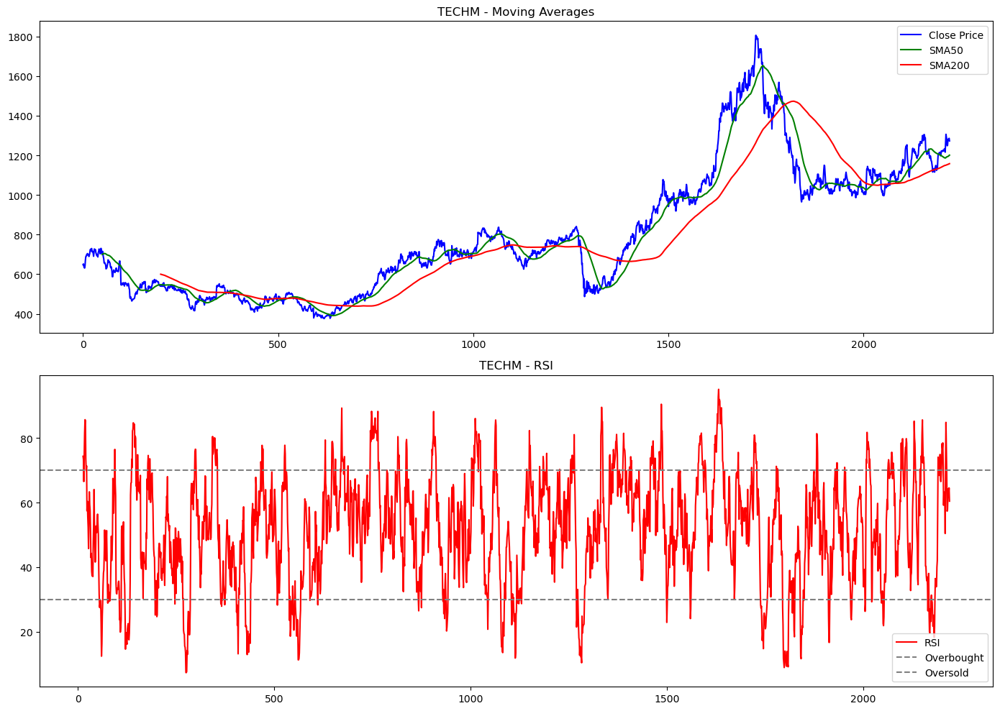

...

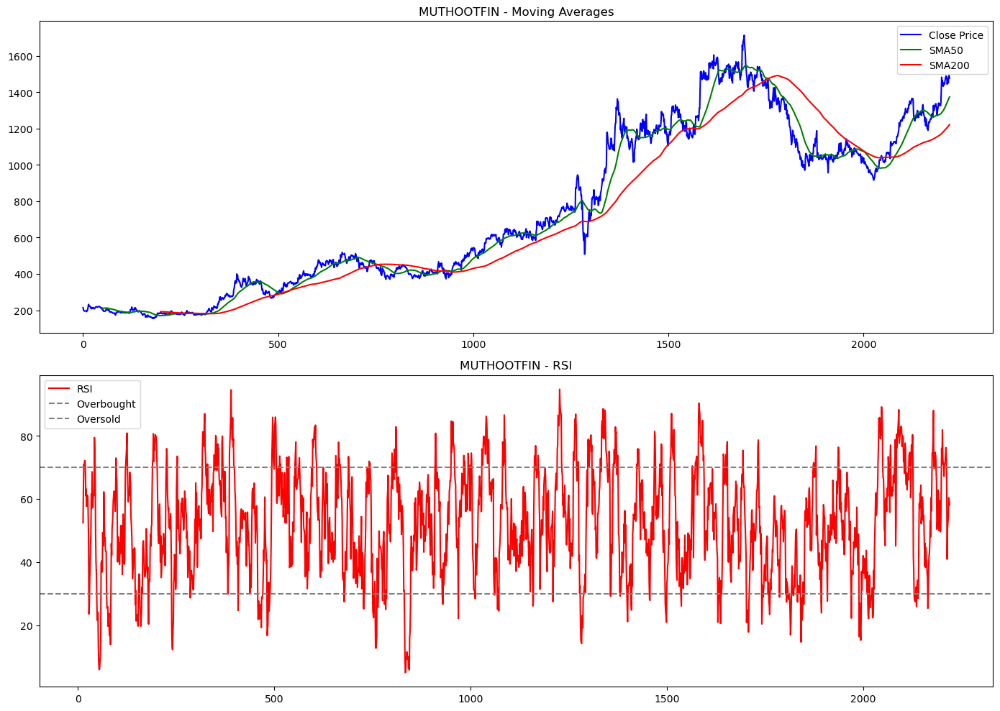

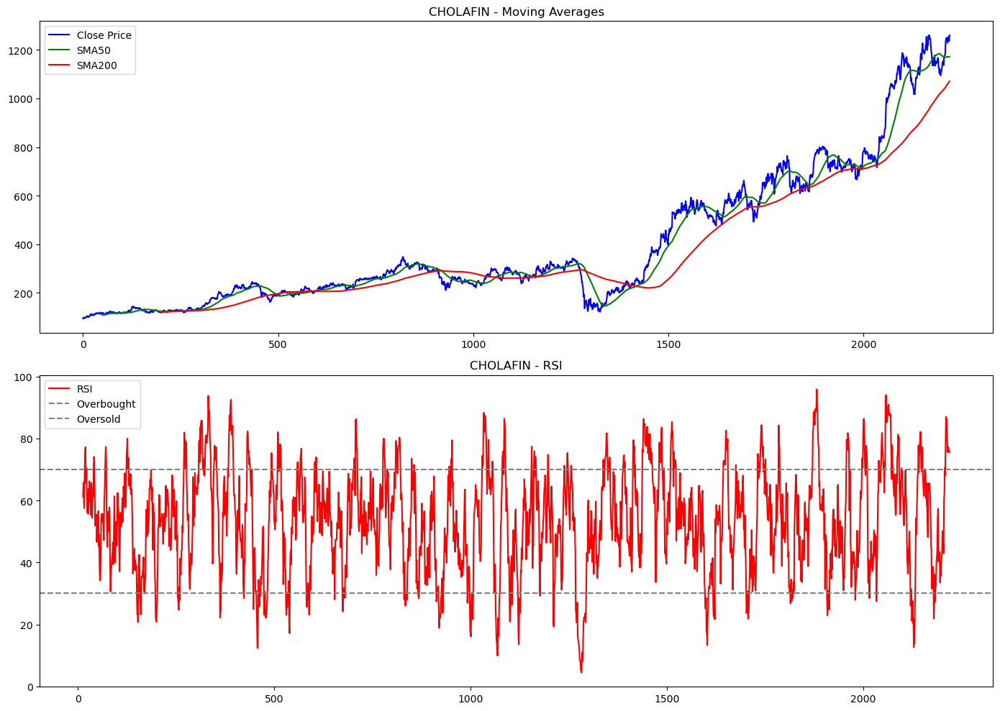

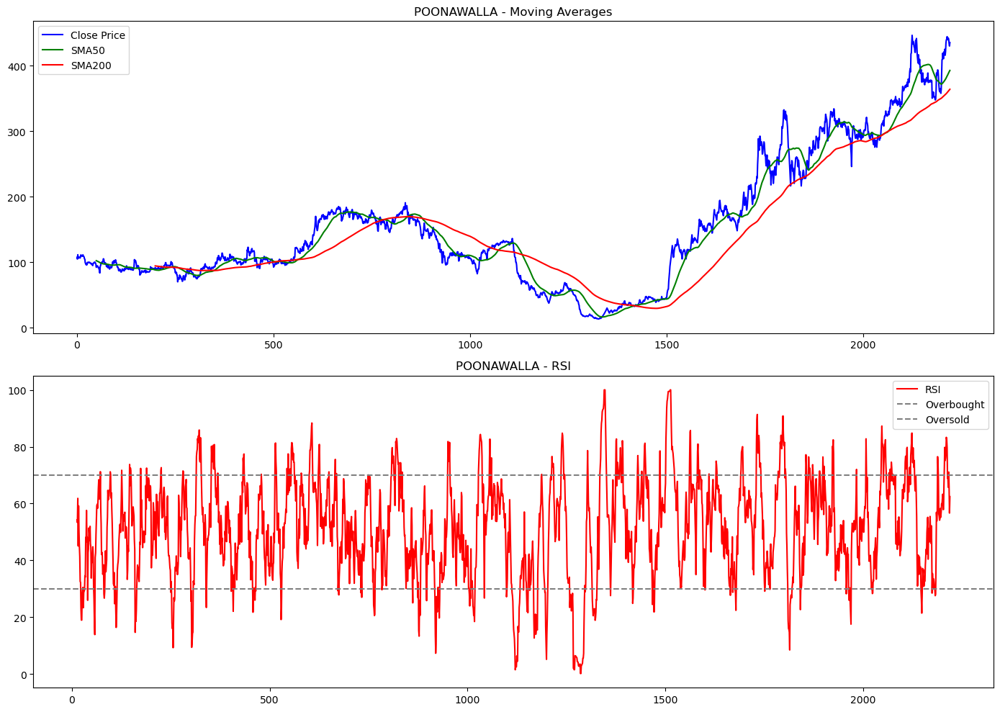

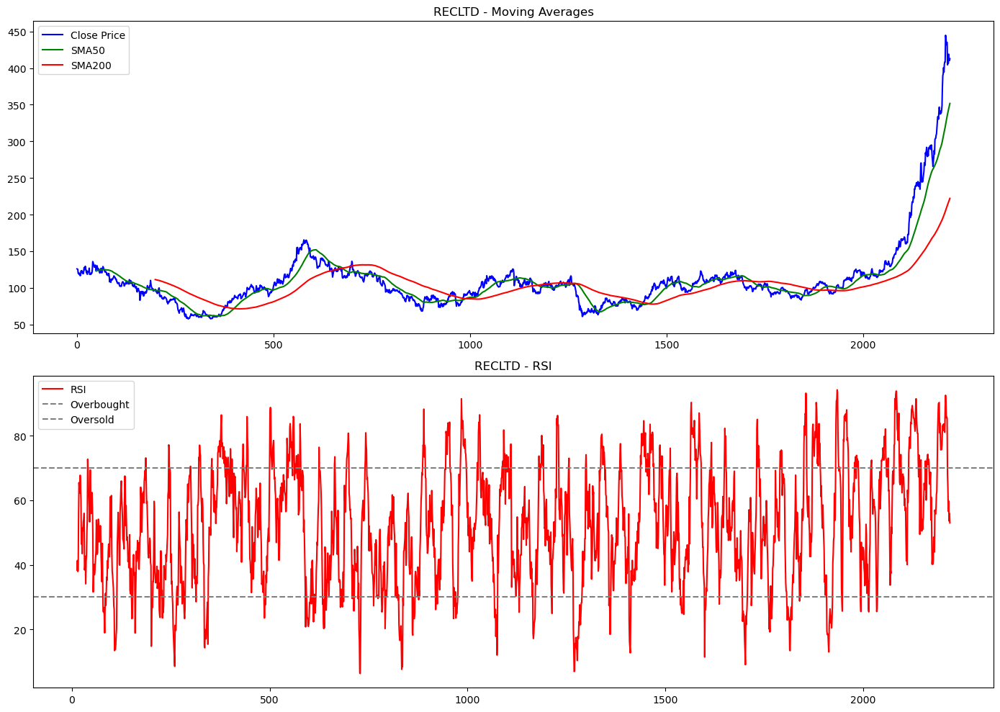

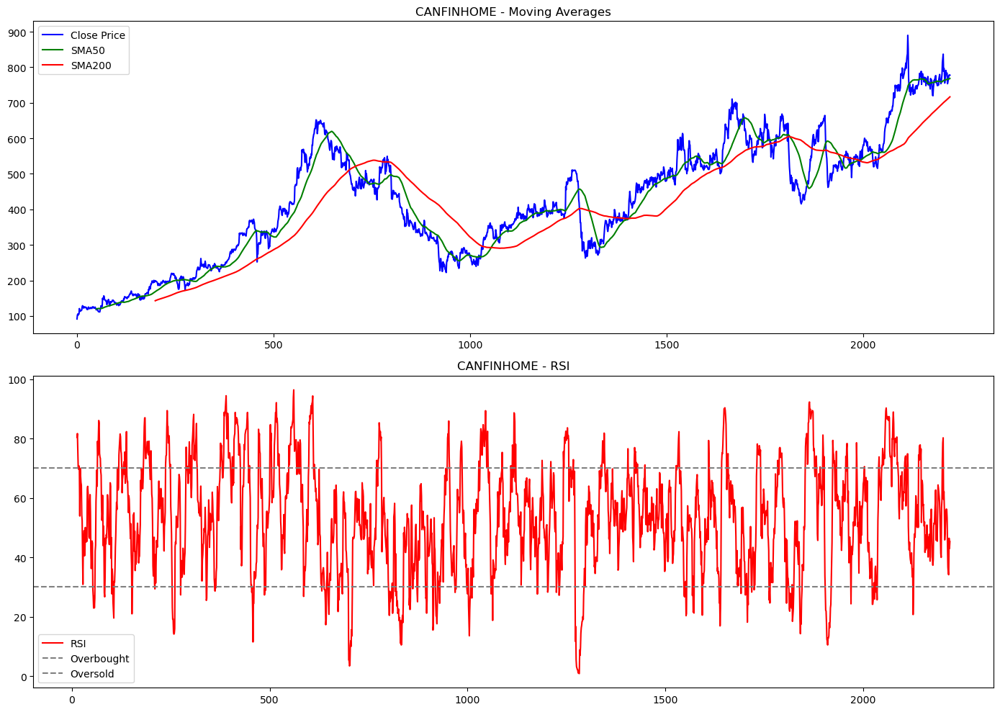

In [6]:
# Function to calculate SMA and EMA
def calculate_moving_averages(data):
    data['SMA50'] = data['Close'].rolling(window=50).mean()
    data['SMA200'] = data['Close'].rolling(window=200).mean()
    data['EMA50'] = data['Close'].ewm(span=50, adjust=False).mean()
    data['EMA200'] = data['Close'].ewm(span=200, adjust=False).mean()
    return data

# Function to calculate Relative Strength Index (RSI)
def calculate_rsi(data, window=14):
    delta = data['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    data['RSI'] = rsi
    return data

# Function to plot Moving Averages and RSI for each stock
def plot_stock_analysis(data, stock_name):
    plt.figure(figsize=(14, 10))

    # Plot Moving Averages
    plt.subplot(2, 1, 1)
    plt.plot(data['Close'], label='Close Price', color='blue')
    plt.plot(data['SMA50'], label='SMA50', color='green')
    plt.plot(data['SMA200'], label='SMA200', color='red')
    plt.title(f'{stock_name} - Moving Averages')
    plt.legend()

    # Plot RSI
    plt.subplot(2, 1, 2)
    plt.plot(data['RSI'], label='RSI', color='red')
    plt.axhline(70, linestyle='--', color='grey', label='Overbought')
    plt.axhline(30, linestyle='--', color='grey', label='Oversold')
    plt.title(f'{stock_name} - RSI')
    plt.legend()

    plt.tight_layout()
    plt.show()

# List of stock file paths for each sector
it_stocks = [
    ("WIPRO", "C:/Users/yashv/Desktop/PROJECT/stock_data/WIPRO.NS.csv"),
    ("COFORGE", "C:/Users/yashv/Desktop/PROJECT/stock_data/COFORGE.NS.csv"),
    ("PERSISTENT", "C:/Users/yashv/Desktop/PROJECT/stock_data/PERSISTENT.NS.csv"),
    ("HCLTECH", "C:/Users/yashv/Desktop/PROJECT/stock_data/HCLTECH.NS.csv"),
    ("TECHM", "C:/Users/yashv/Desktop/PROJECT/stock_data/TECHM.NS.csv"),
    ("TCS", "C:/Users/yashv/Desktop/PROJECT/stock_data/TCS.NS.csv"),
    ("SASKEN", "C:/Users/yashv/Desktop/PROJECT/stock_data/SASKEN.NS.csv")
]

healthcare_stocks = [
    ("AUROPHARMA", "C:/Users/yashv/Desktop/PROJECT/stock_data/AUROPHARMA.NS.csv"),
    ("FORTIS", "C:/Users/yashv/Desktop/PROJECT/stock_data/FORTIS.NS.csv"),
    ("ALKEM", "C:/Users/yashv/Desktop/PROJECT/stock_data/ALKEM.NS.csv"),
    ("LUPIN", "C:/Users/yashv/Desktop/PROJECT/stock_data/LUPIN.NS.csv"),
    ("IPCALAB", "C:/Users/yashv/Desktop/PROJECT/stock_data/IPCALAB.NS.csv"),
    ("ZYDUSLIFE", "C:/Users/yashv/Desktop/PROJECT/stock_data/ZYDUSLIFE.NS.csv"),
    ("DRREDDY", "C:/Users/yashv/Desktop/PROJECT/stock_data/DRREDDY.NS.csv"),
    ("BIOCON", "C:/Users/yashv/Desktop/PROJECT/stock_data/BIOCON.NS.csv")
]

banking_stocks = [
    ("IDFCFIRSTB", "C:/Users/yashv/Desktop/PROJECT/stock_data/IDFCFIRSTB.NS.csv"),
    ("LICHSGFIN", "C:/Users/yashv/Desktop/PROJECT/stock_data/LICHSGFIN.NS.csv"),
    ("MUTHOOTFIN", "C:/Users/yashv/Desktop/PROJECT/stock_data/MUTHOOTFIN.NS.csv"),
    ("CHOLAFIN", "C:/Users/yashv/Desktop/PROJECT/stock_data/CHOLAFIN.NS.csv"),
    ("POONAWALLA", "C:/Users/yashv/Desktop/PROJECT/stock_data/POONAWALLA.NS.csv"),
    ("RECLTD", "C:/Users/yashv/Desktop/PROJECT/stock_data/RECLTD.NS.csv"),
    ("CANFINHOME", "C:/Users/yashv/Desktop/PROJECT/stock_data/CANFINHOME.NS.csv")
]

# Combine all sectors into a single list
all_stocks = it_stocks + healthcare_stocks + banking_stocks

# Loop through each stock, calculate indicators, and plot
for stock_name, file_path in all_stocks:
    stock_data = pd.read_csv(file_path)
    stock_data = calculate_moving_averages(stock_data)
    stock_data = calculate_rsi(stock_data)
    plot_stock_analysis(stock_data, stock_name)


In [13]:
pip install pandas matplotlib statsmodels


Note: you may need to restart the kernel to use updated packages.


In [19]:
pip install pmdarima


Note: you may need to restart the kernel to use updated packages.


PREDICTION OF HISTORICAL DATA PATTERN USING ARIMA MODEL

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


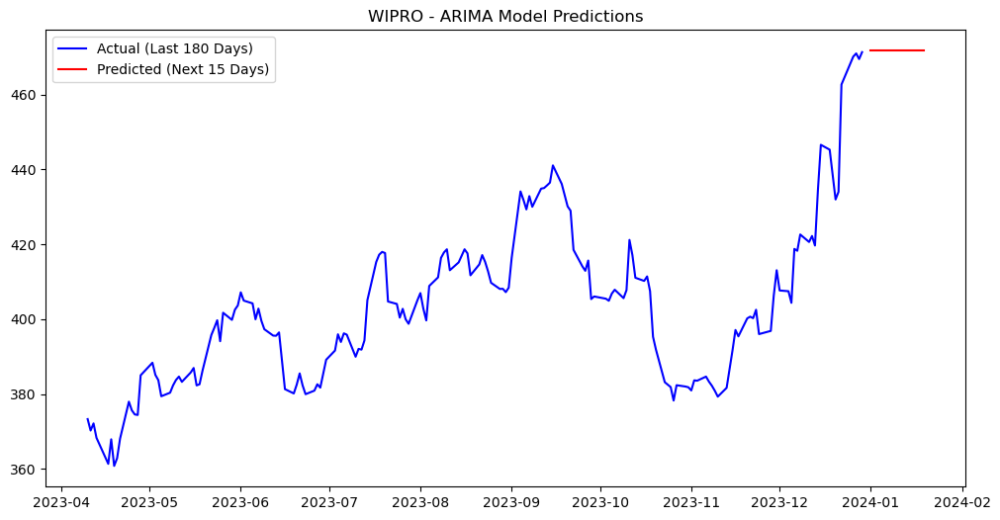

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


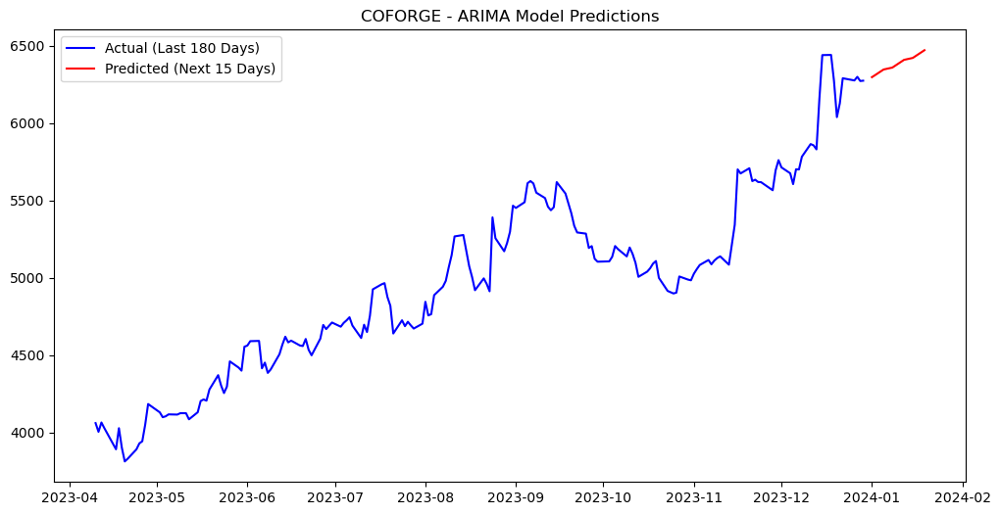

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


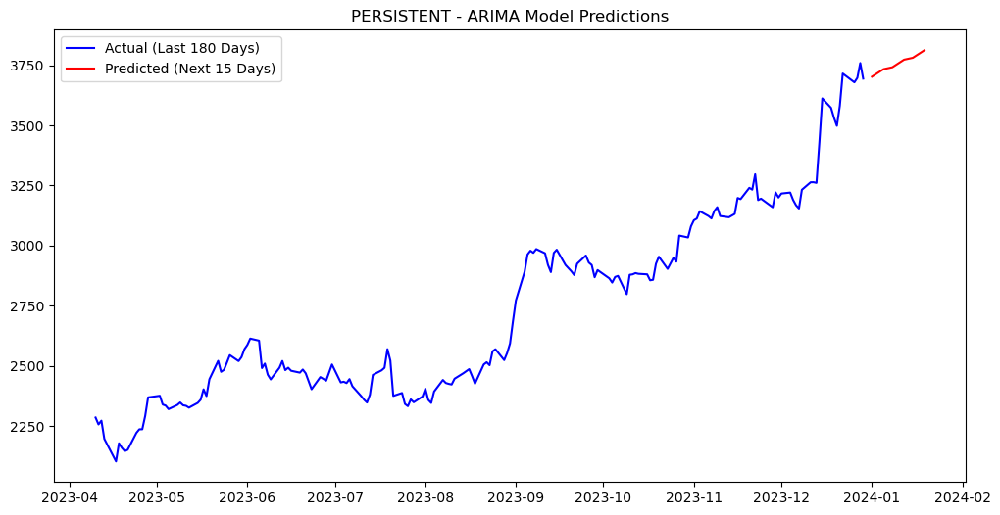

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


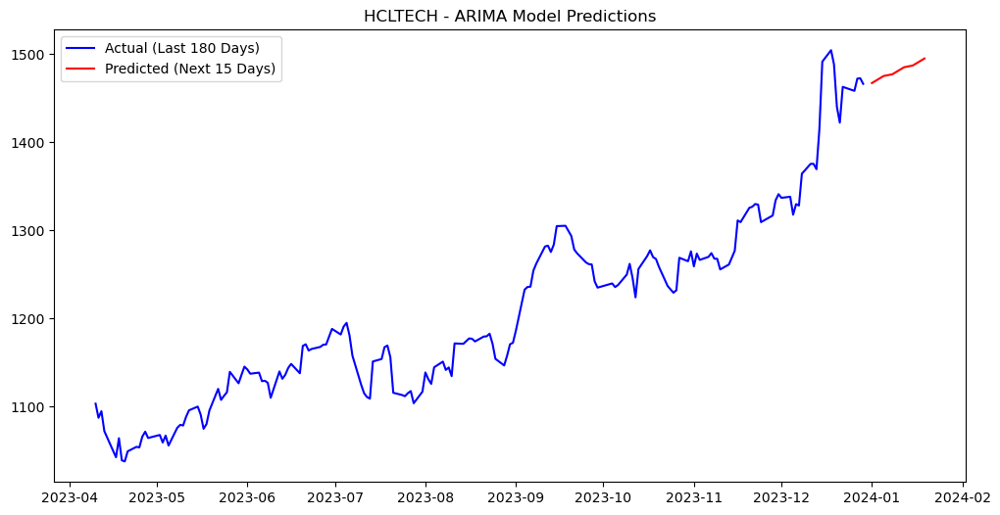

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


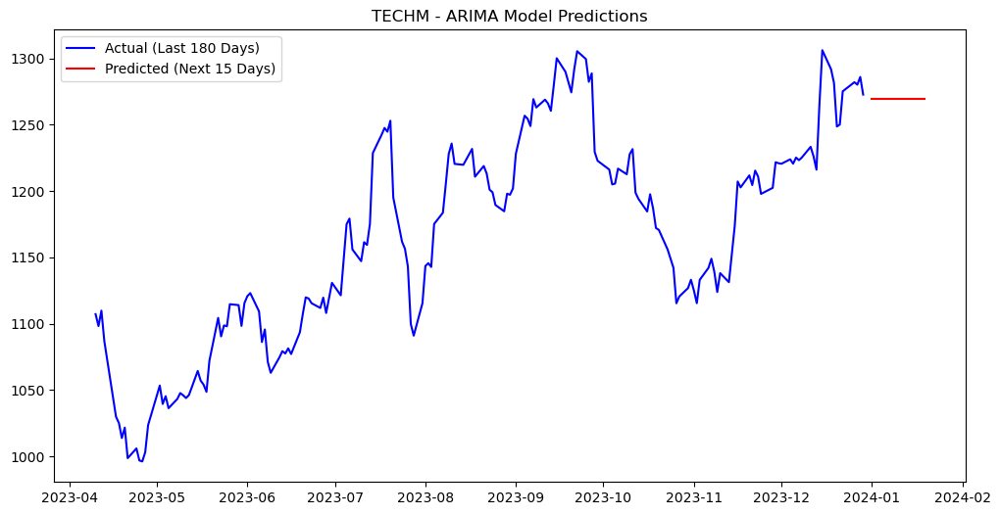

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


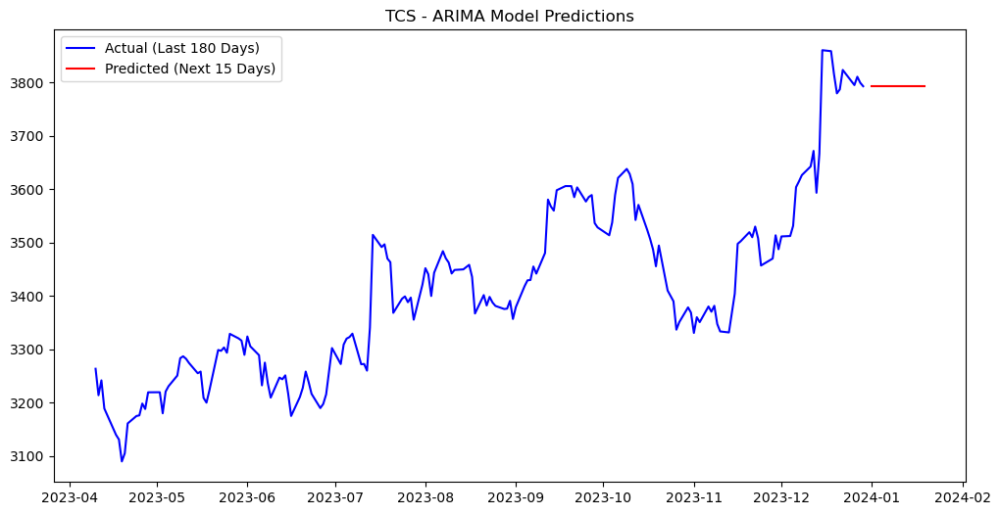

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


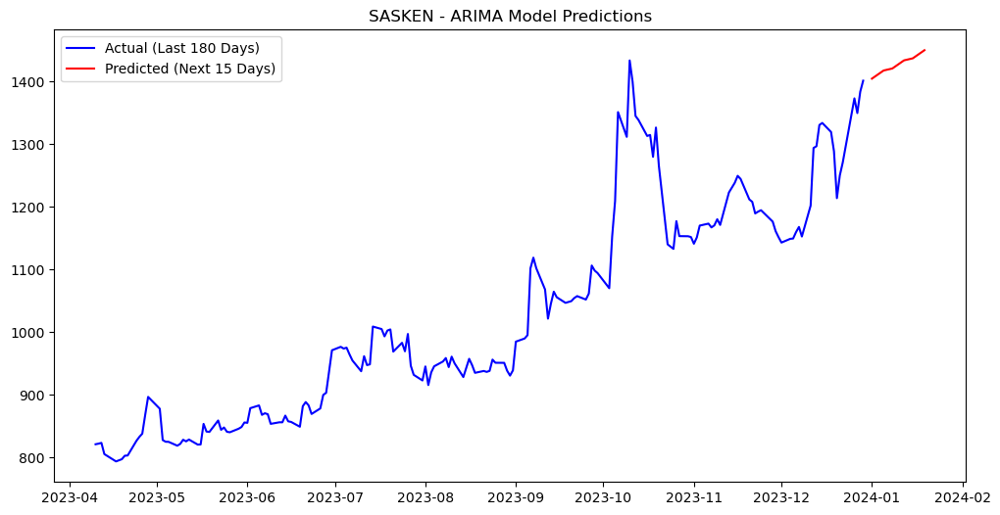

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


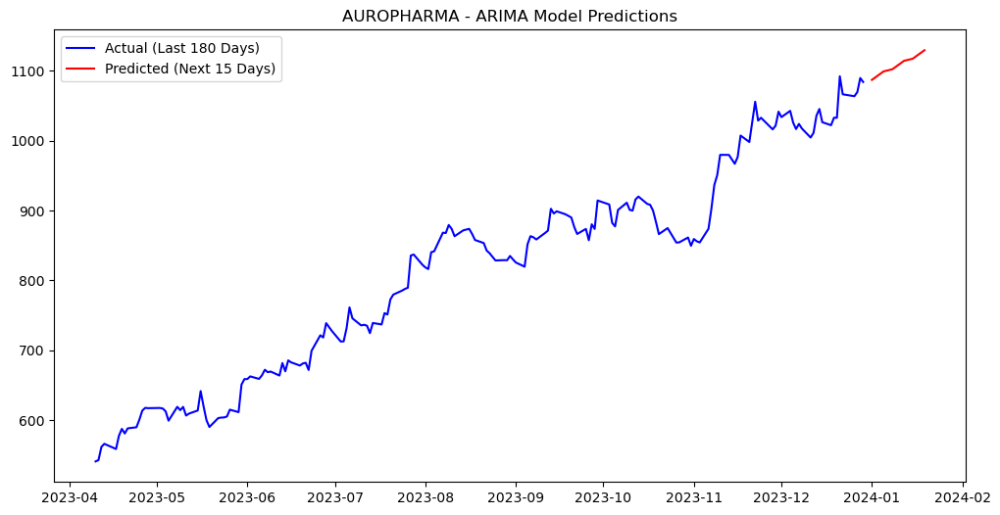

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


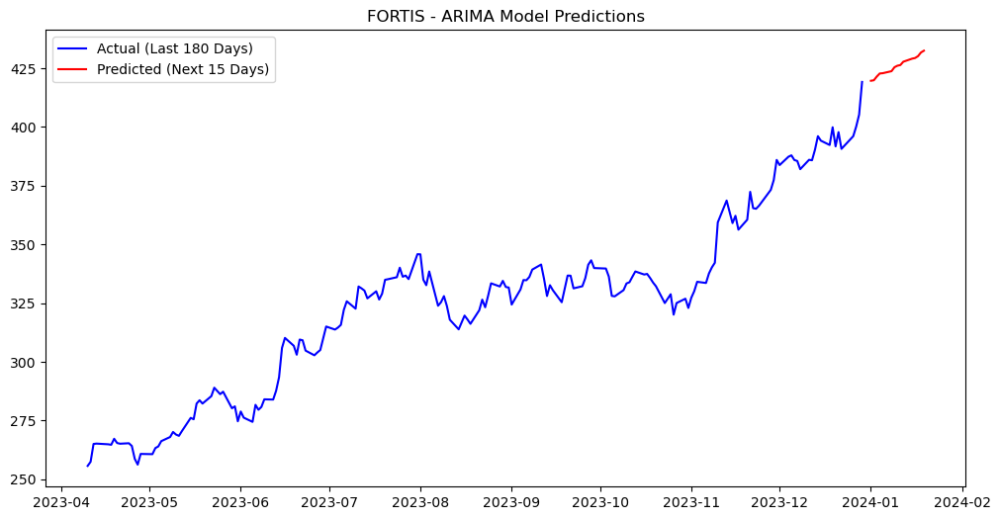

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


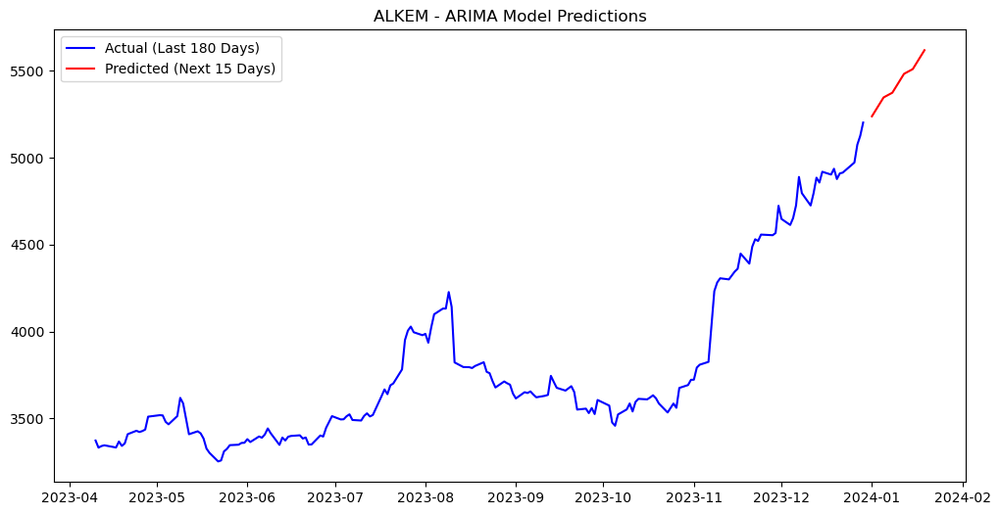

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


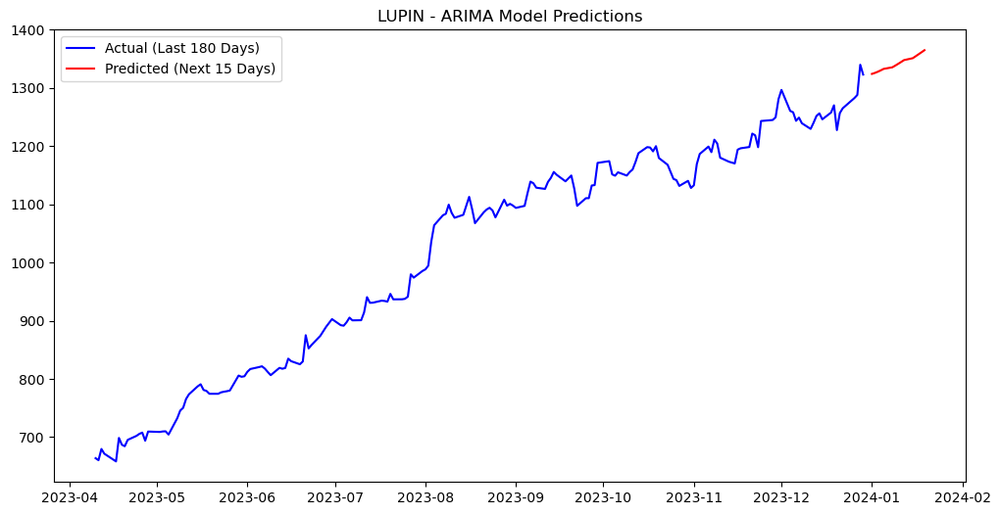

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


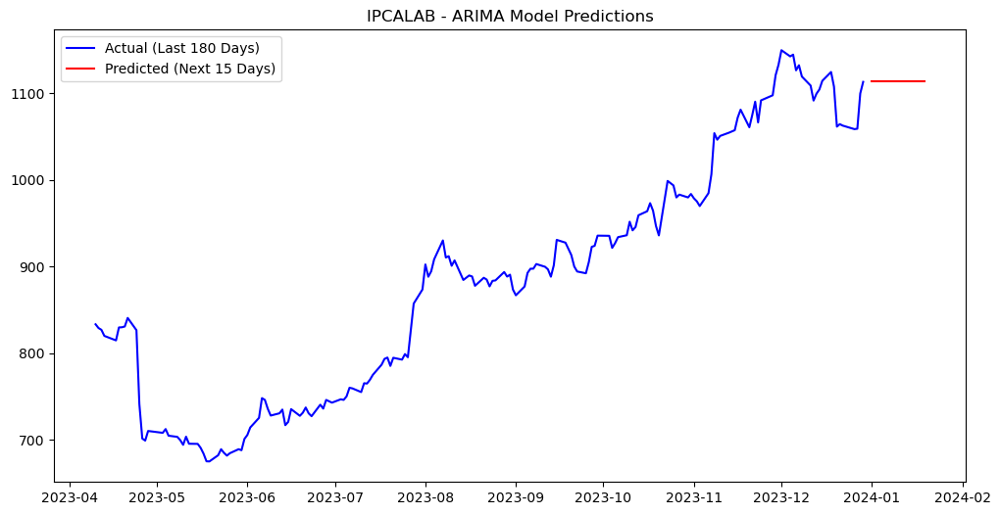

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


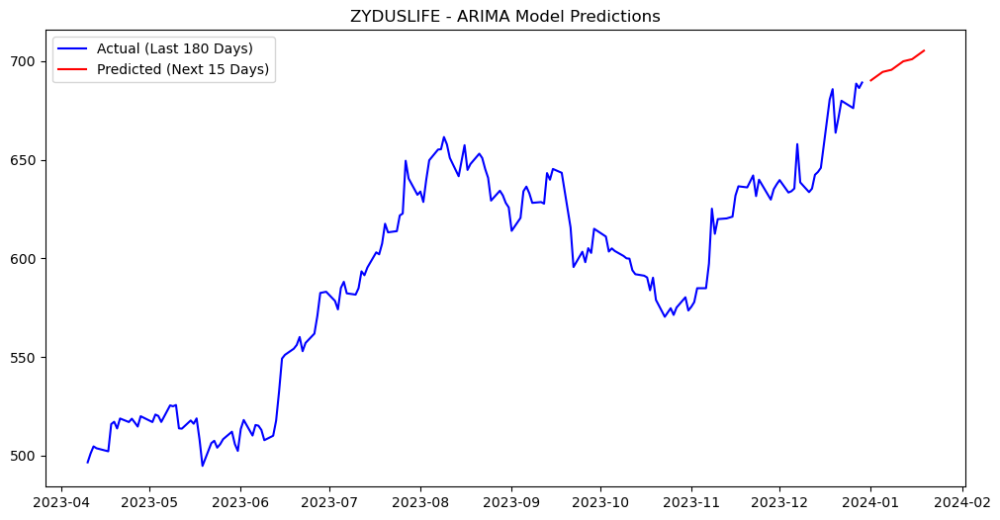

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


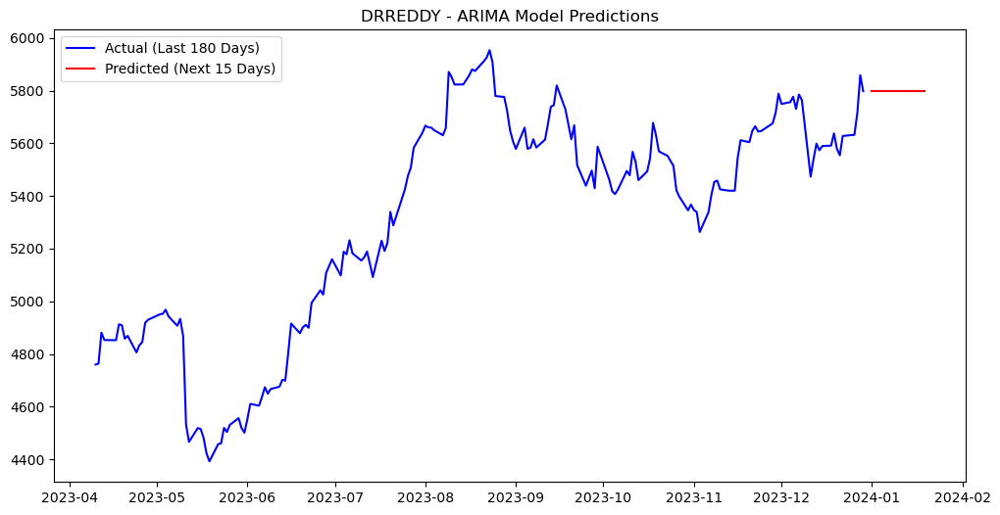

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


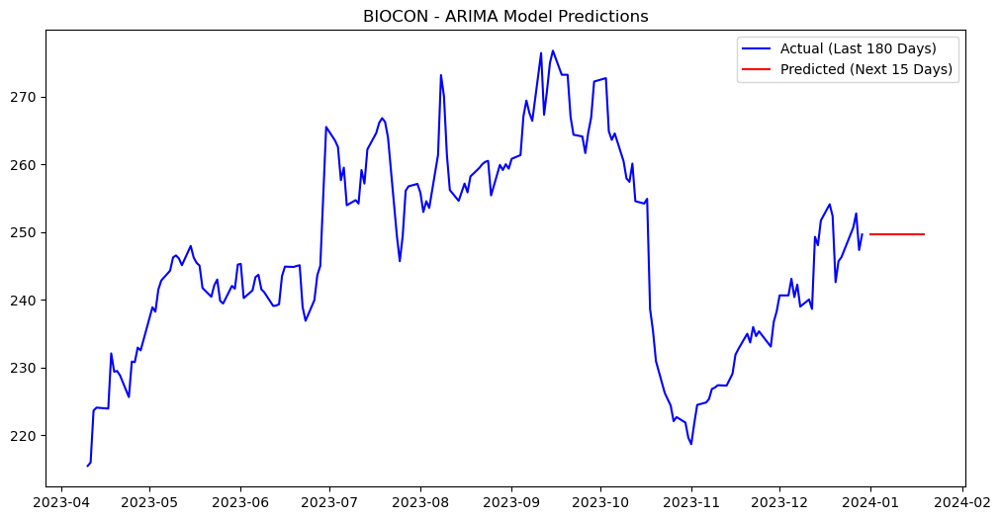

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


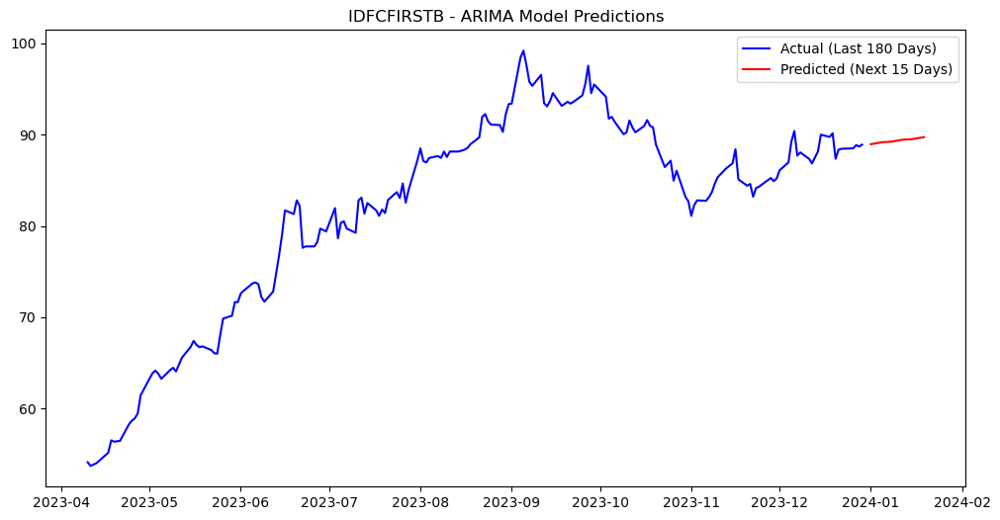

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


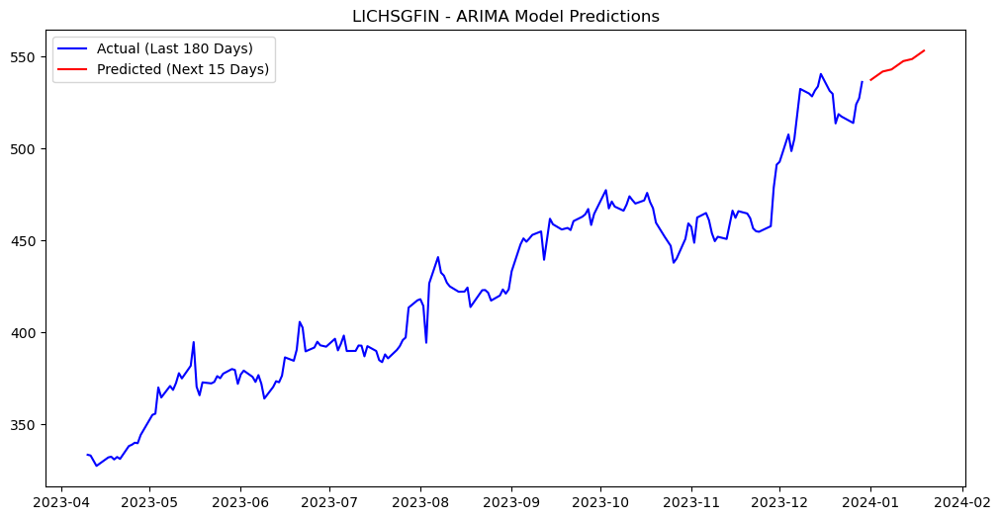

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


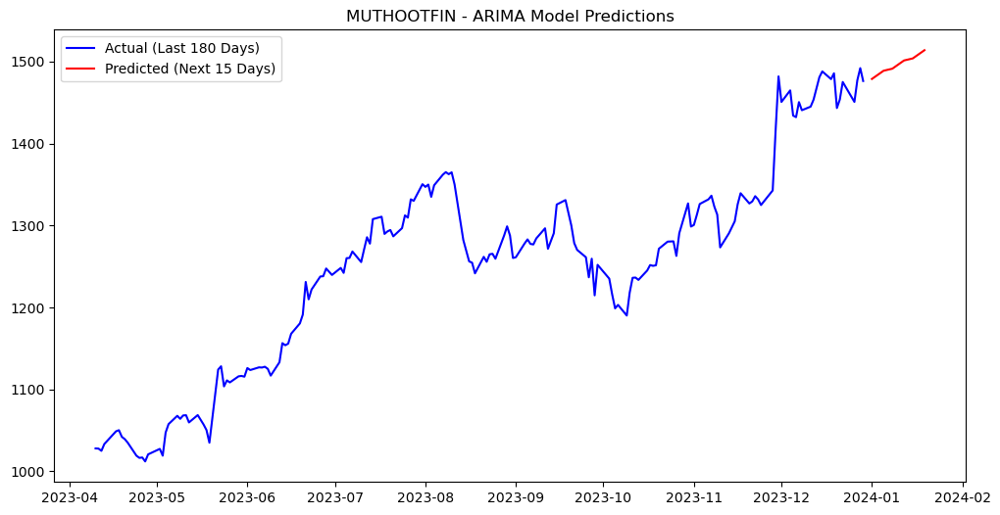

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


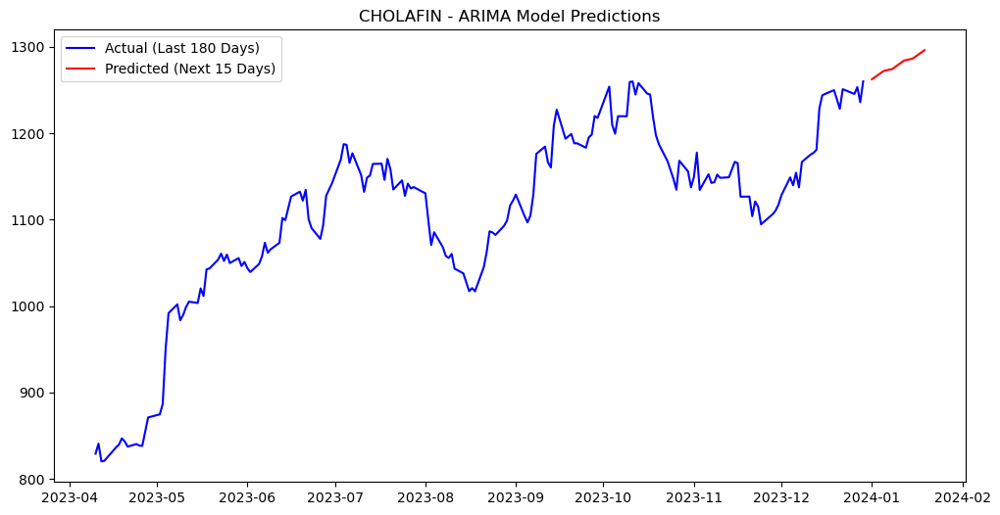

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


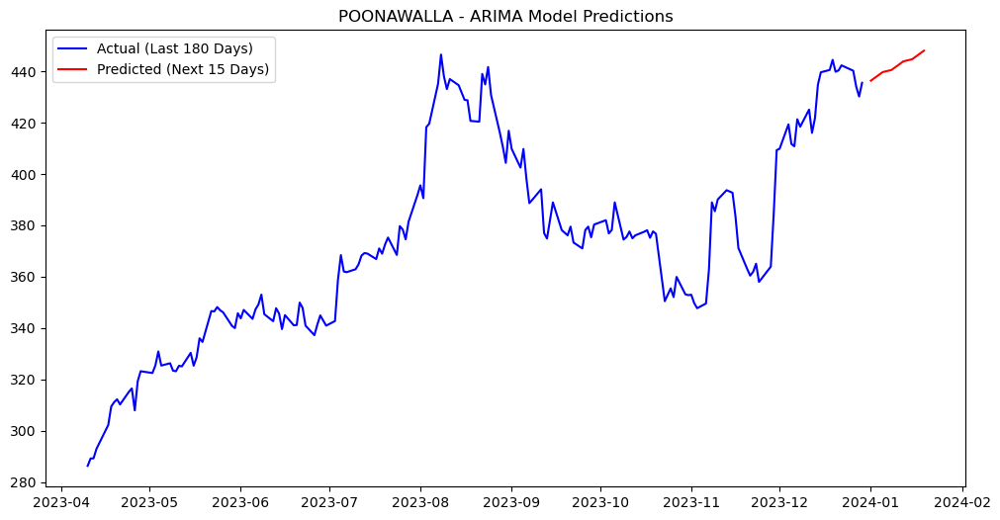

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


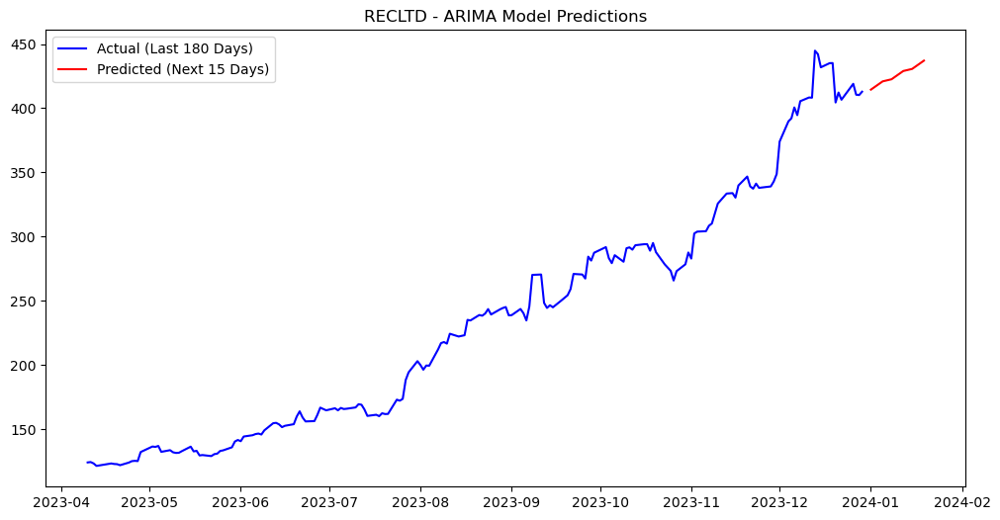

C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\yashv\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


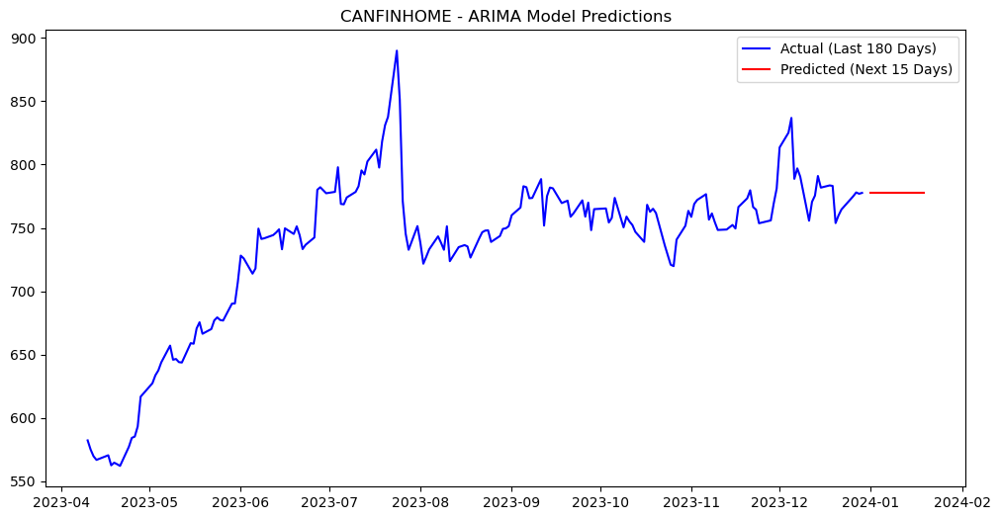

In [8]:

# Function to fit ARIMA model and plot results
def arima_prediction(stock_name, file_path):
    # Load the stock data
    data = pd.read_csv(file_path)

    # Ensure 'Date' is in datetime format and set as index
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index('Date', inplace=True)

    # Drop any NaN values
    data.dropna(inplace=True)

    # Select the last 180 days of data for training the model
    train_data = data['Close'].tail(180)

    # Fit ARIMA model
    model = auto_arima(train_data, 
                       seasonal=True,   
                       stepwise=True,   
                       trace=False)     

    # Number of days to predict
    n_periods = 15
    predicted_values = model.predict(n_periods=n_periods)

    # Plot the actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(train_data.index, train_data, label='Actual (Last 180 Days)', color='blue')
    plt.plot(pd.date_range(train_data.index[-1], periods=n_periods+1, freq='B')[1:], predicted_values, label='Predicted (Next 15 Days)', color='red')
    plt.title(f'{stock_name} - ARIMA Model Predictions')
    plt.legend()
    plt.show()

# Loop through each stock, fit ARIMA model, and display predictions
for stock_name, file_path in all_stocks:
    arima_prediction(stock_name, file_path)


ANALYZING THE HOSTORICAL PATTERN OF STOCK USING ARIMA+LSTM MODEL FOR BETTER RESULT

C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


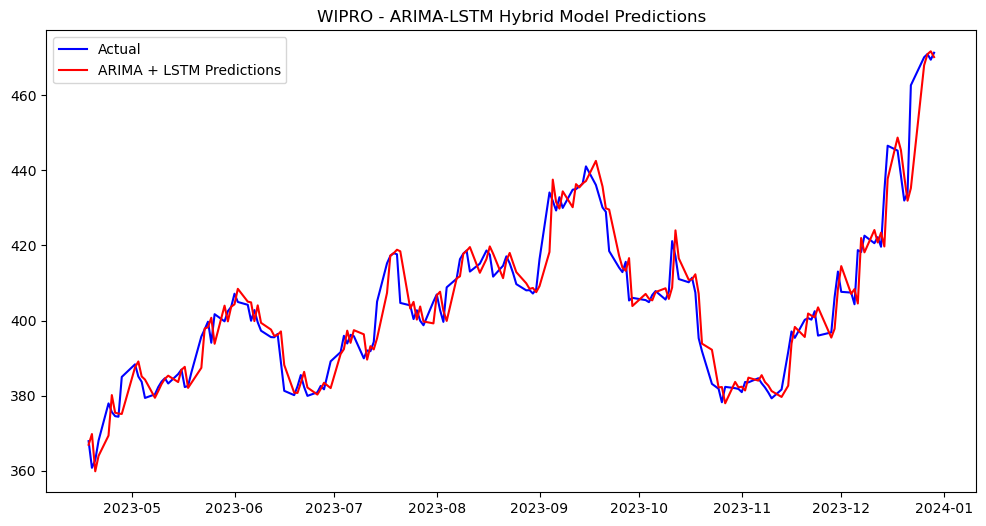

Final ARIMA + LSTM Predicted Values for WIPRO:
Date
2023-04-18    366.938555
2023-04-19    369.798609
2023-04-20    359.878643
2023-04-21    363.984551
2023-04-24    369.380442
                 ...    
2023-12-22    435.232879
2023-12-26    467.977203
2023-12-27    470.919231
2023-12-28    471.692077
2023-12-29    470.147958
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


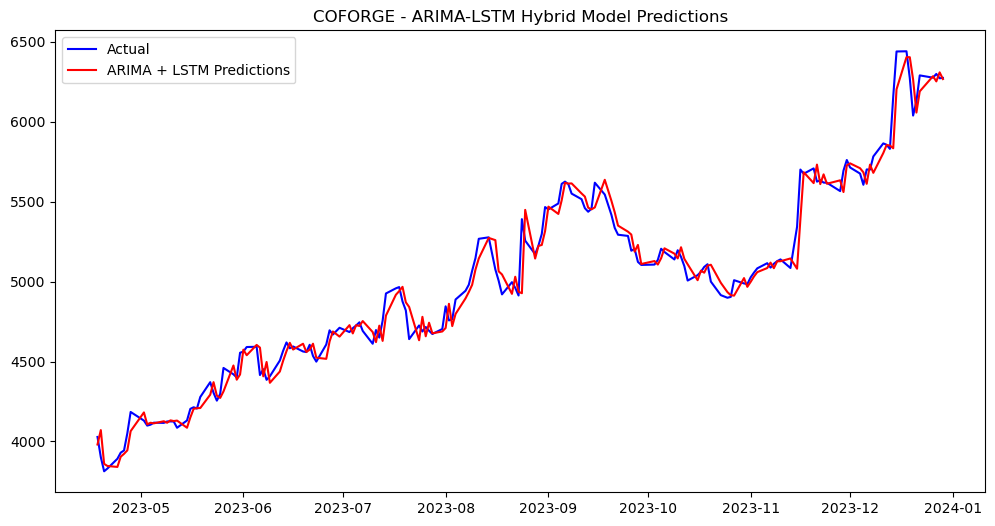

Final ARIMA + LSTM Predicted Values for COFORGE:
Date
2023-04-18    3981.012417
2023-04-19    4071.030788
2023-04-20    3859.785289
2023-04-21    3846.587956
2023-04-24    3840.628293
                 ...     
2023-12-22    6190.243926
2023-12-26    6285.134236
2023-12-27    6252.630807
2023-12-28    6309.216601
2023-12-29    6267.313220
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step


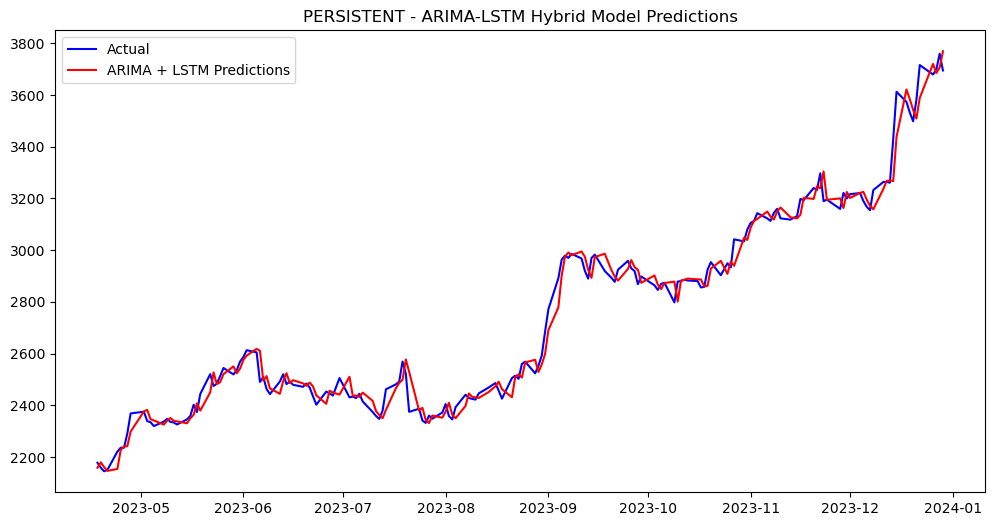

Final ARIMA + LSTM Predicted Values for PERSISTENT:
Date
2023-04-18    2158.905010
2023-04-19    2179.620737
2023-04-20    2160.889768
2023-04-21    2146.596992
2023-04-24    2154.031794
                 ...     
2023-12-22    3588.561515
2023-12-26    3719.807723
2023-12-27    3685.239977
2023-12-28    3705.635011
2023-12-29    3769.016020
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step


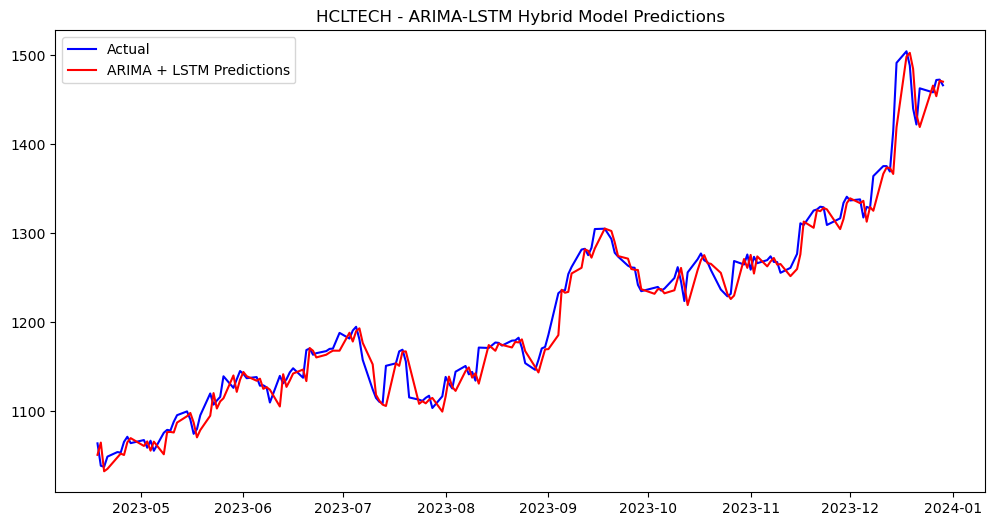

Final ARIMA + LSTM Predicted Values for HCLTECH:
Date
2023-04-18    1050.940856
2023-04-19    1064.740942
2023-04-20    1032.481973
2023-04-21    1035.206416
2023-04-24    1047.941207
                 ...     
2023-12-22    1419.225774
2023-12-26    1465.728374
2023-12-27    1453.829675
2023-12-28    1471.306774
2023-12-29    1470.171640
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step


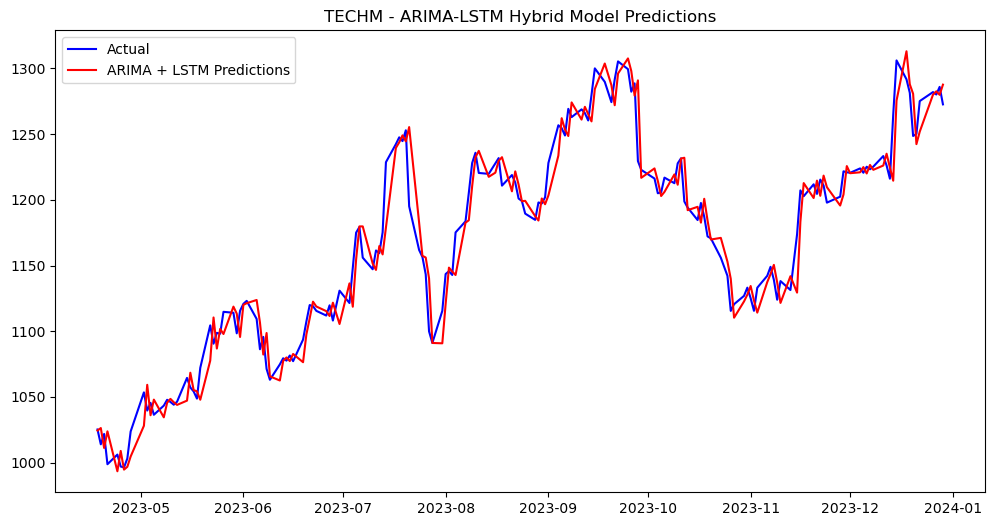

Final ARIMA + LSTM Predicted Values for TECHM:
Date
2023-04-18    1024.398806
2023-04-19    1026.292177
2023-04-20    1011.125421
2023-04-21    1023.795744
2023-04-24     993.388171
                 ...     
2023-12-22    1251.864084
2023-12-26    1280.034725
2023-12-27    1282.599348
2023-12-28    1279.916826
2023-12-29    1287.658691
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


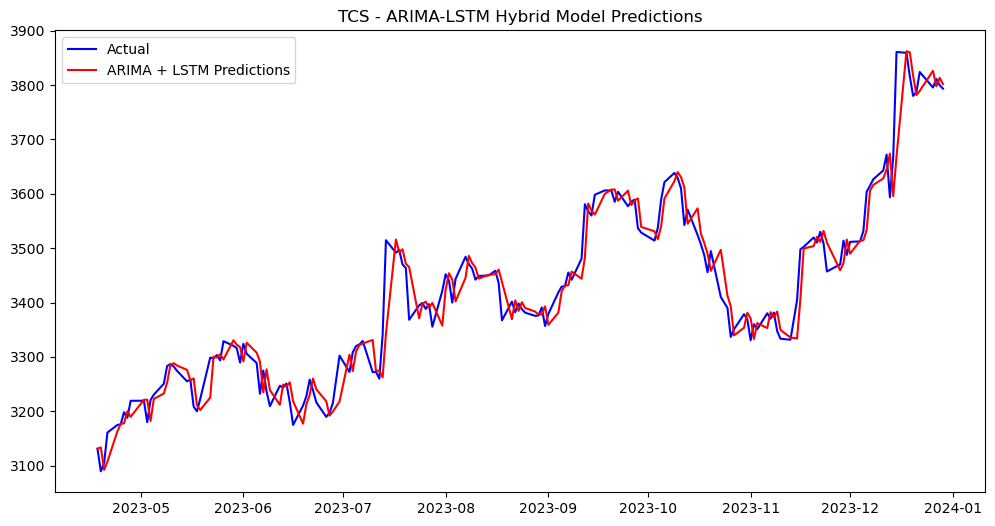

Final ARIMA + LSTM Predicted Values for TCS:
Date
2023-04-18    3131.375033
2023-04-19    3133.454537
2023-04-20    3092.289647
2023-04-21    3107.482692
2023-04-24    3163.051286
                 ...     
2023-12-22    3789.333764
2023-12-26    3826.282578
2023-12-27    3797.828942
2023-12-28    3813.287000
2023-12-29    3801.922401
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step


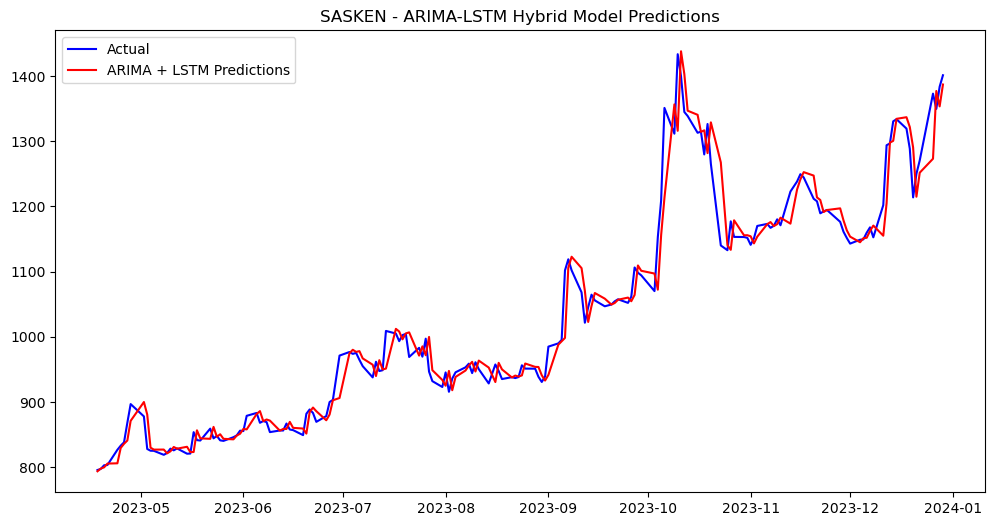

Final ARIMA + LSTM Predicted Values for SASKEN:
Date
2023-04-18     793.769887
2023-04-19     797.919359
2023-04-20     799.831029
2023-04-21     805.590297
2023-04-24     805.998644
                 ...     
2023-12-22    1251.898300
2023-12-26    1273.257987
2023-12-27    1377.217394
2023-12-28    1353.556743
2023-12-29    1387.123275
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


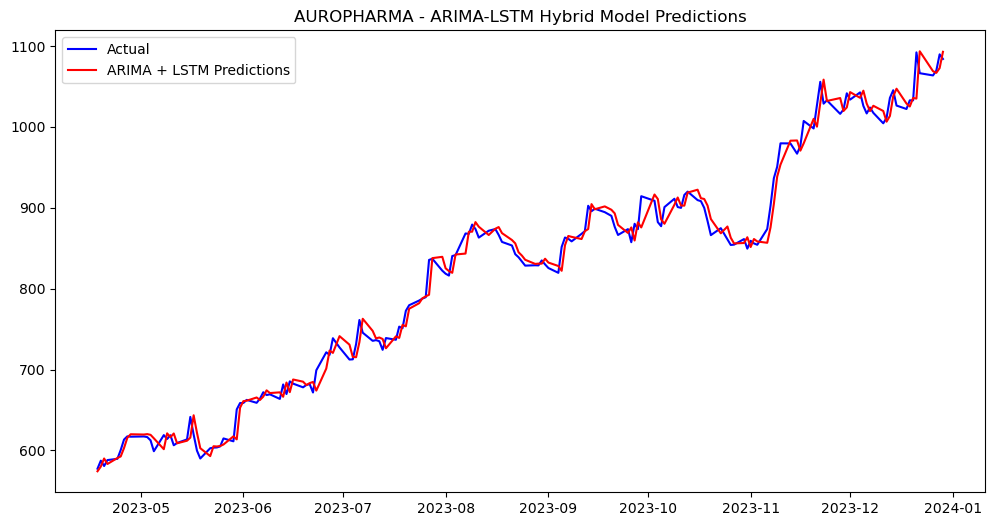

Final ARIMA + LSTM Predicted Values for AUROPHARMA:
Date
2023-04-18     574.249496
2023-04-19     580.070387
2023-04-20     590.048181
2023-04-21     583.271040
2023-04-24     590.641652
                 ...     
2023-12-22    1093.508862
2023-12-26    1068.897243
2023-12-27    1066.819286
2023-12-28    1072.751363
2023-12-29    1092.846912
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step


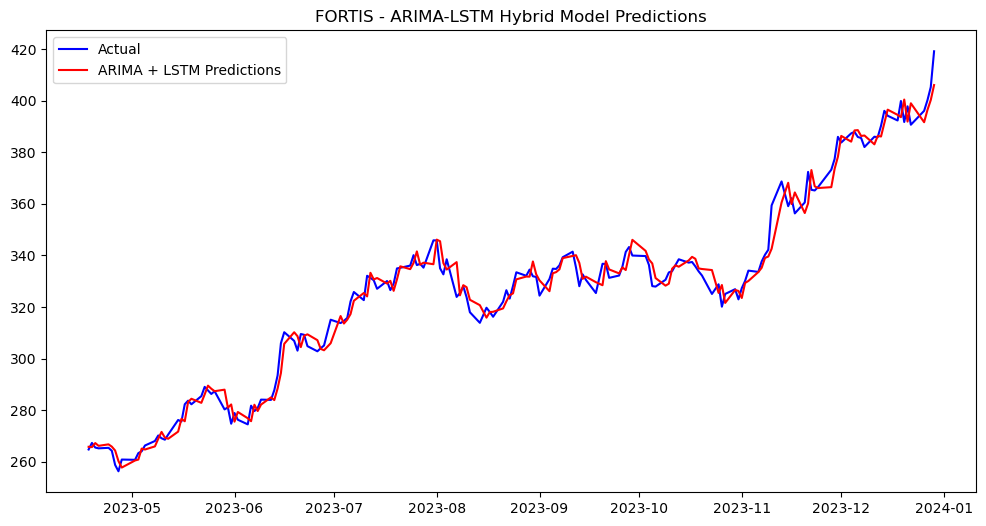

Final ARIMA + LSTM Predicted Values for FORTIS:
Date
2023-04-18    265.741552
2023-04-19    265.634329
2023-04-20    267.193598
2023-04-21    266.121080
2023-04-24    266.696269
                 ...    
2023-12-22    399.025416
2023-12-26    391.676407
2023-12-27    396.410463
2023-12-28    400.268233
2023-12-29    406.096781
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


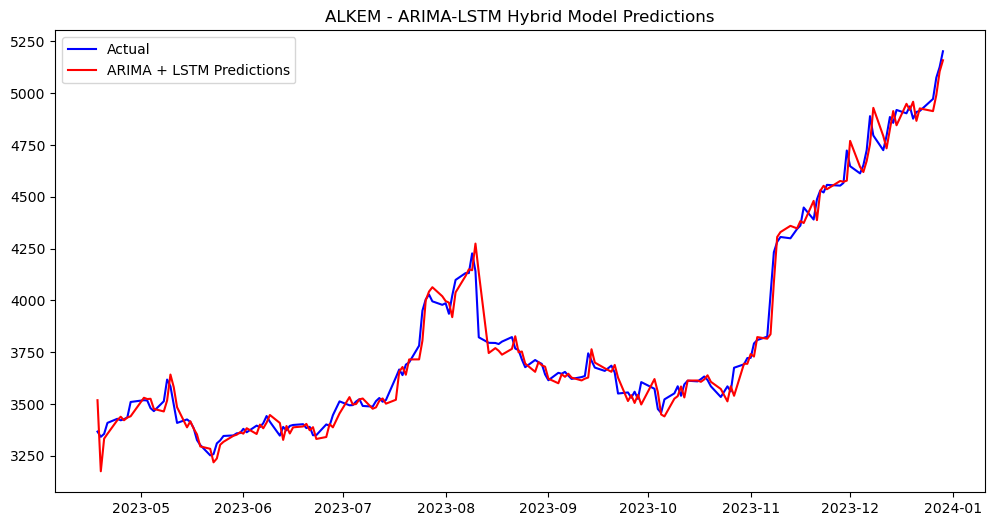

Final ARIMA + LSTM Predicted Values for ALKEM:
Date
2023-04-18    3518.466285
2023-04-19    3175.409329
2023-04-20    3332.856916
2023-04-21    3356.086298
2023-04-24    3422.454956
                 ...     
2023-12-22    4926.797506
2023-12-26    4913.701045
2023-12-27    4991.466240
2023-12-28    5104.793639
2023-12-29    5159.311132
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step


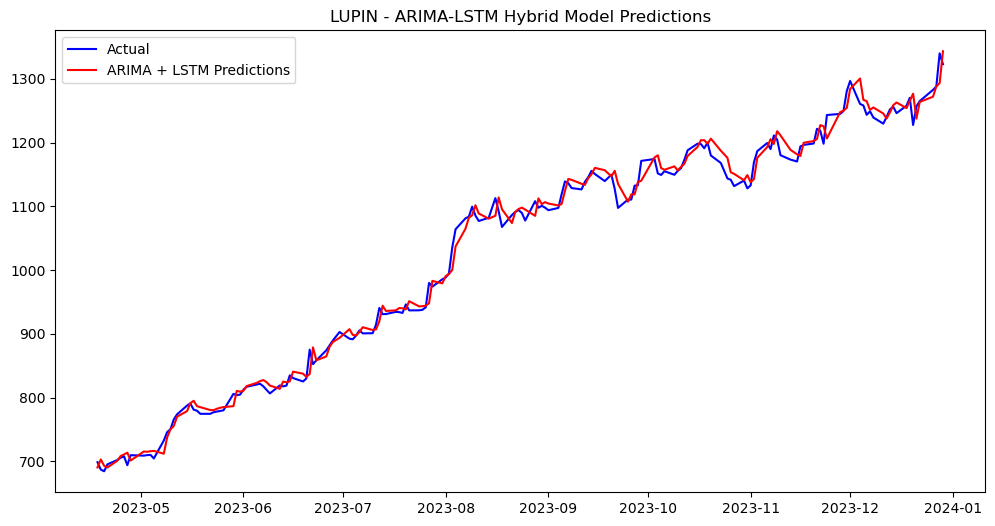

Final ARIMA + LSTM Predicted Values for LUPIN:
Date
2023-04-18     690.237569
2023-04-19     702.825243
2023-04-20     692.921831
2023-04-21     690.263434
2023-04-24     700.921672
                 ...     
2023-12-22    1263.722545
2023-12-26    1271.937179
2023-12-27    1288.072900
2023-12-28    1293.250047
2023-12-29    1343.209275
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step


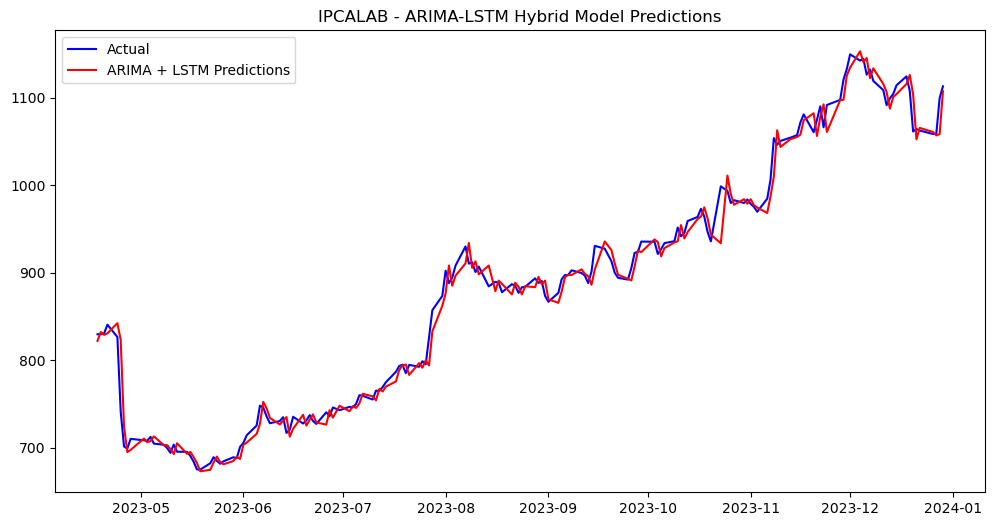

Final ARIMA + LSTM Predicted Values for IPCALAB:
Date
2023-04-18     822.129948
2023-04-19     832.286261
2023-04-20     829.023162
2023-04-21     830.782108
2023-04-24     842.409001
                 ...     
2023-12-22    1065.599471
2023-12-26    1060.957108
2023-12-27    1056.979635
2023-12-28    1058.544549
2023-12-29    1107.640913
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


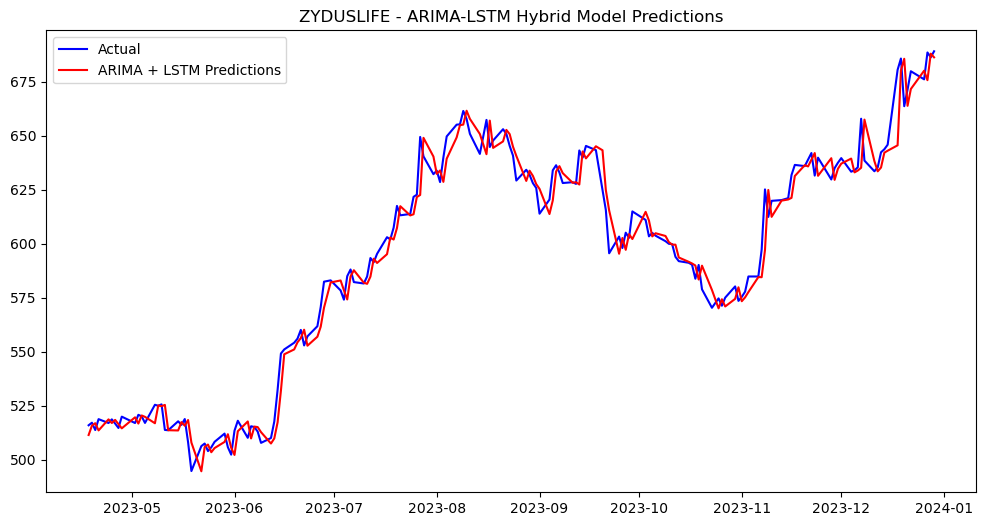

Final ARIMA + LSTM Predicted Values for ZYDUSLIFE:
Date
2023-04-18    511.395060
2023-04-19    515.700600
2023-04-20    516.880568
2023-04-21    513.528764
2023-04-24    518.645156
                 ...    
2023-12-22    671.727251
2023-12-26    680.203307
2023-12-27    675.808886
2023-12-28    688.094394
2023-12-29    686.392044
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step


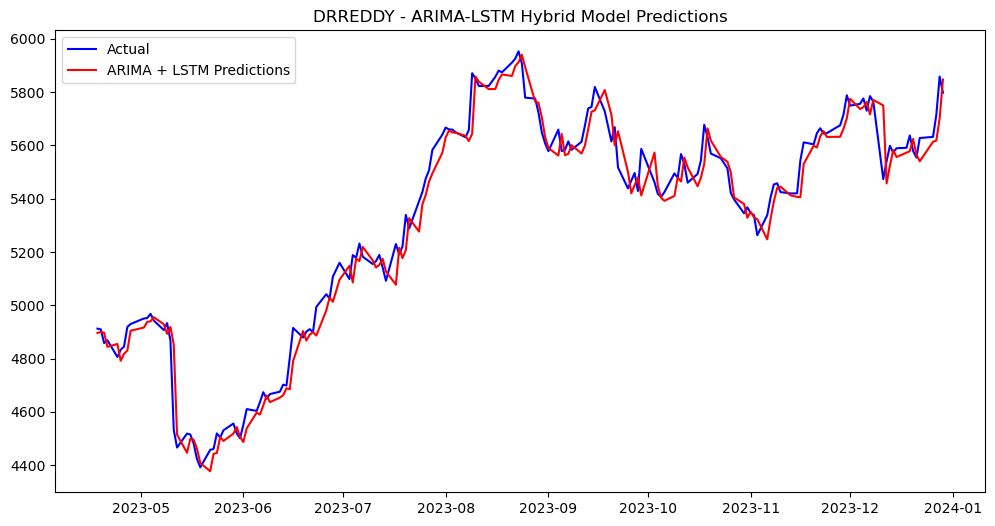

Final ARIMA + LSTM Predicted Values for DRREDDY:
Date
2023-04-18    4896.400436
2023-04-19    4899.897008
2023-04-20    4896.916595
2023-04-21    4844.048228
2023-04-24    4854.809586
                 ...     
2023-12-22    5540.300127
2023-12-26    5613.640662
2023-12-27    5618.319839
2023-12-28    5700.900052
2023-12-29    5847.112722
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


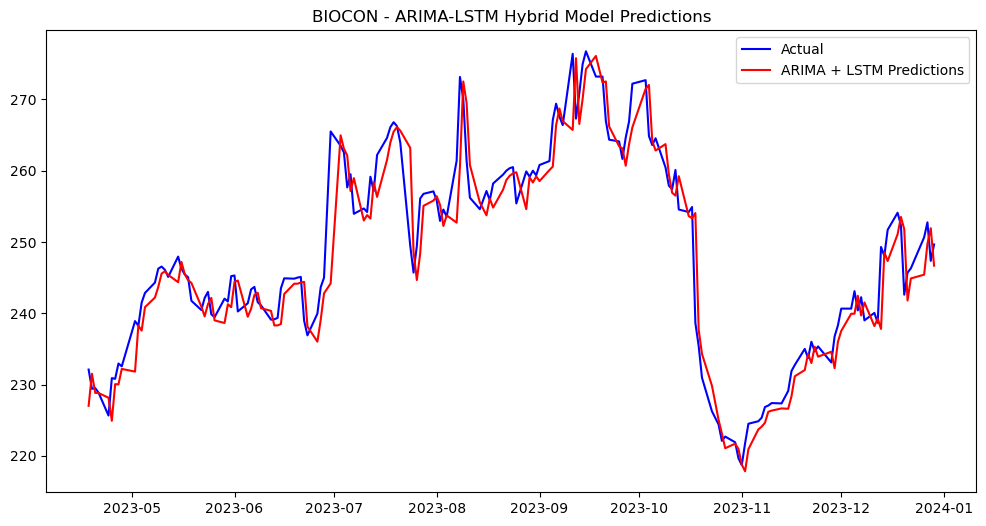

Final ARIMA + LSTM Predicted Values for BIOCON:
Date
2023-04-18    227.012054
2023-04-19    231.512709
2023-04-20    228.824270
2023-04-21    228.806239
2023-04-24    228.145982
                 ...    
2023-12-22    244.881647
2023-12-26    245.411536
2023-12-27    249.755679
2023-12-28    251.928310
2023-12-29    246.672443
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step


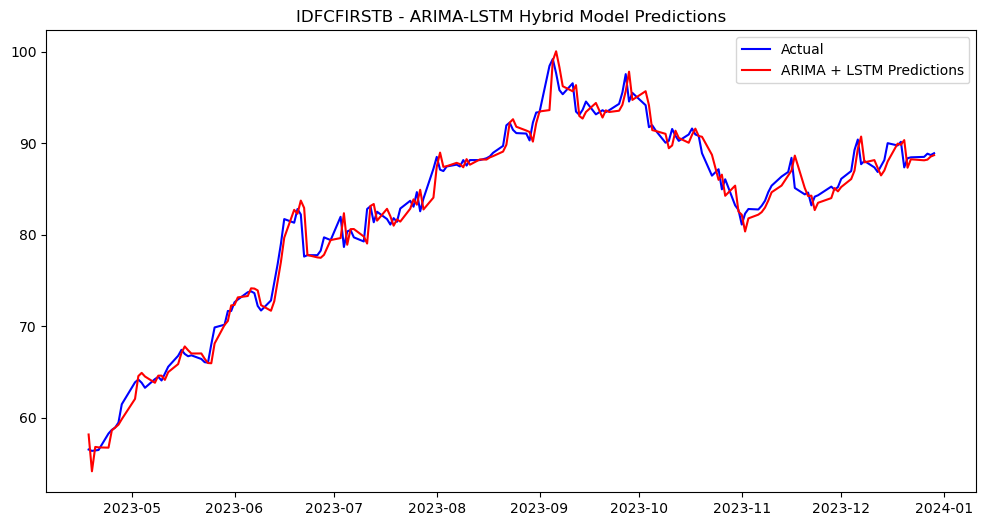

Final ARIMA + LSTM Predicted Values for IDFCFIRSTB:
Date
2023-04-18    58.144240
2023-04-19    54.121421
2023-04-20    56.781803
2023-04-21    56.732735
2023-04-24    56.703346
                ...    
2023-12-22    88.236059
2023-12-26    88.124701
2023-12-27    88.199900
2023-12-28    88.535473
2023-12-29    88.687987
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


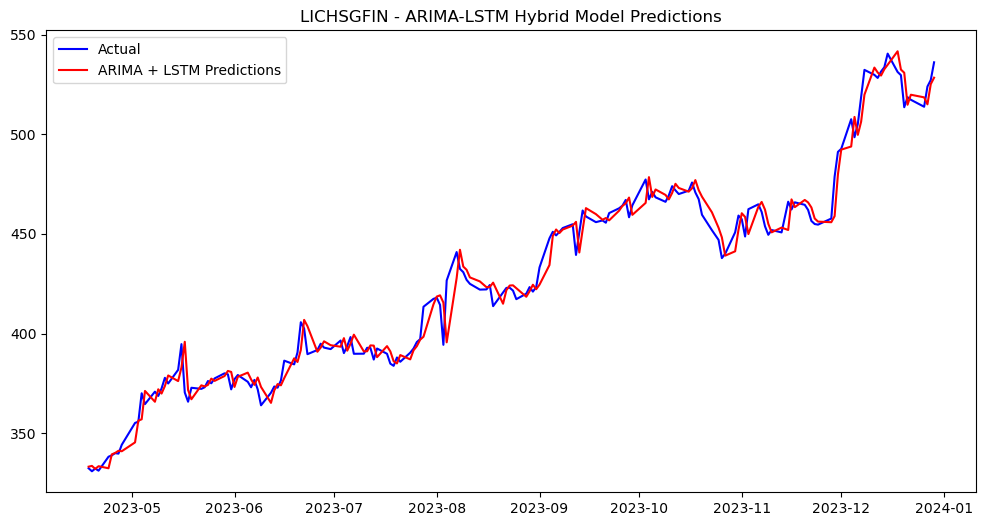

Final ARIMA + LSTM Predicted Values for LICHSGFIN:
Date
2023-04-18    333.204832
2023-04-19    333.599003
2023-04-20    332.101362
2023-04-21    333.451208
2023-04-24    332.406006
                 ...    
2023-12-22    519.830662
2023-12-26    518.514270
2023-12-27    515.013279
2023-12-28    525.136826
2023-12-29    528.384459
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


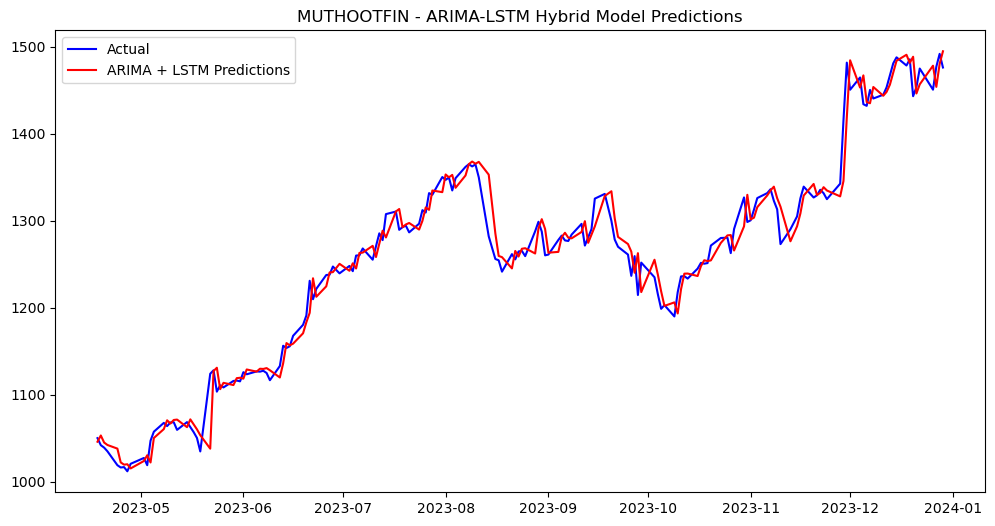

Final ARIMA + LSTM Predicted Values for MUTHOOTFIN:
Date
2023-04-18    1046.061470
2023-04-19    1053.249888
2023-04-20    1045.140736
2023-04-21    1042.335968
2023-04-24    1038.152866
                 ...     
2023-12-22    1456.949327
2023-12-26    1478.370905
2023-12-27    1454.042926
2023-12-28    1480.438558
2023-12-29    1494.953565
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step


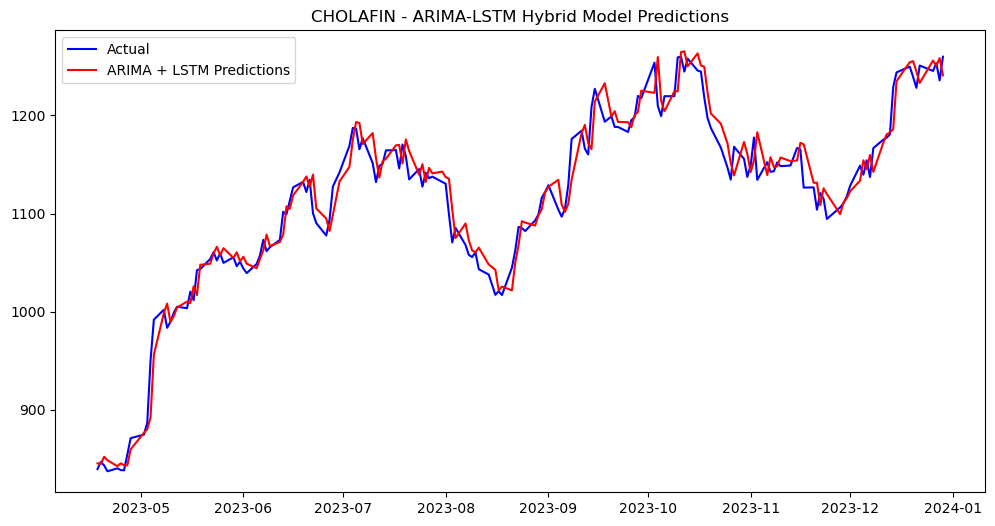

Final ARIMA + LSTM Predicted Values for CHOLAFIN:
Date
2023-04-18     845.424485
2023-04-19     844.804024
2023-04-20     852.145928
2023-04-21     848.582868
2023-04-24     842.513976
                 ...     
2023-12-22    1233.040525
2023-12-26    1255.908828
2023-12-27    1250.413741
2023-12-28    1258.389785
2023-12-29    1240.773304
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


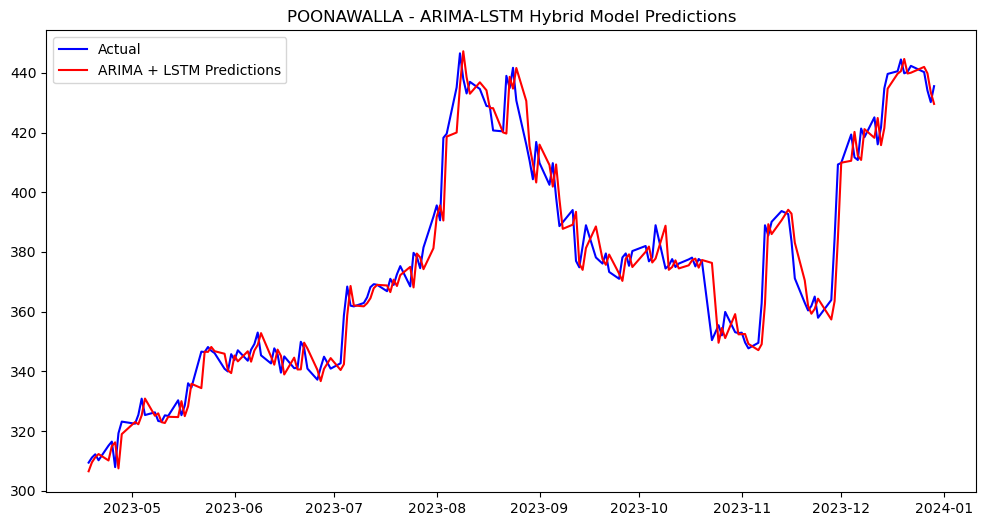

Final ARIMA + LSTM Predicted Values for POONAWALLA:
Date
2023-04-18    306.507162
2023-04-19    309.497584
2023-04-20    311.203222
2023-04-21    312.279728
2023-04-24    310.128463
                 ...    
2023-12-22    440.046588
2023-12-26    441.998057
2023-12-27    439.855915
2023-12-28    433.536874
2023-12-29    429.596855
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


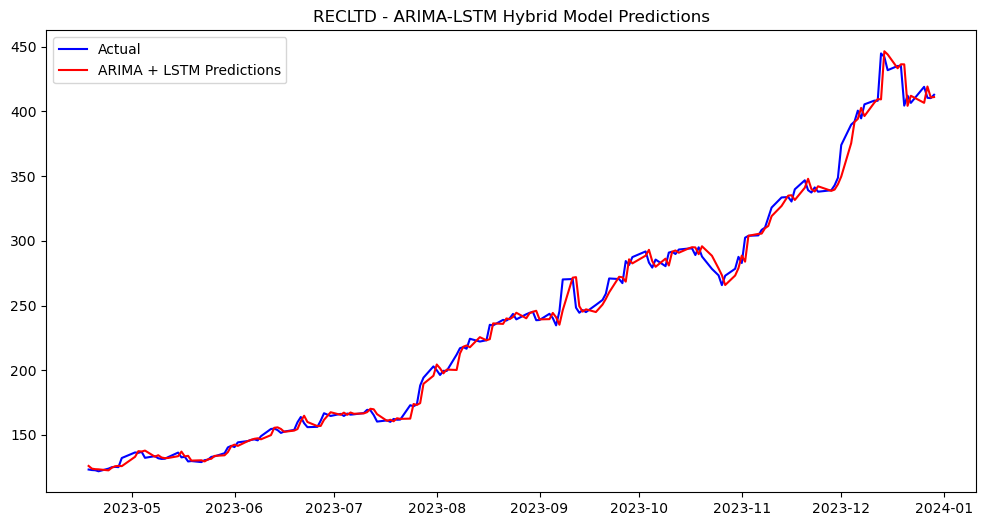

Final ARIMA + LSTM Predicted Values for RECLTD:
Date
2023-04-18    126.021848
2023-04-19    123.926018
2023-04-20    123.524513
2023-04-21    123.394262
2023-04-24    122.610590
                 ...    
2023-12-22    412.076021
2023-12-26    406.608226
2023-12-27    419.239655
2023-12-28    410.754681
2023-12-29    411.079260
Name: predicted_mean, Length: 175, dtype: float64


C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


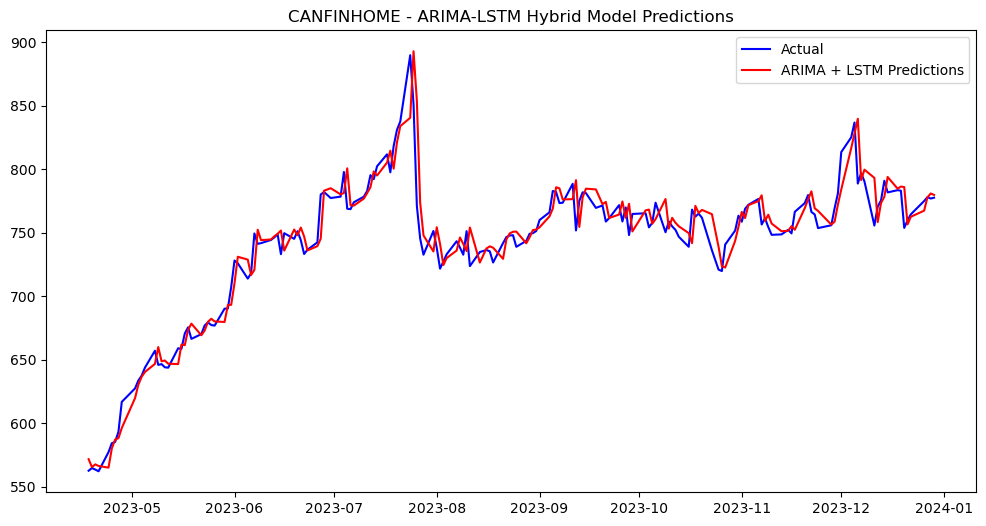

Final ARIMA + LSTM Predicted Values for CANFINHOME:
Date
2023-04-18    571.557869
2023-04-19    565.309125
2023-04-20    567.412298
2023-04-21    566.210273
2023-04-24    564.857475
                 ...    
2023-12-22    762.610083
2023-12-26    767.401819
2023-12-27    777.922498
2023-12-28    780.948329
2023-12-29    779.825968
Name: predicted_mean, Length: 175, dtype: float64
         Stock                                    Predicted_Value
0        WIPRO  [366.93855482053056, 369.79860878469464, 359.8...
1      COFORGE  [3981.012417333727, 4071.030788475524, 3859.78...
2   PERSISTENT  [2158.9050095627426, 2179.620736891997, 2160.8...
3      HCLTECH  [1050.9408556883361, 1064.7409416178598, 1032....
4        TECHM  [1024.3988061442192, 1026.2921767774778, 1011....
5          TCS  [3131.375033378601, 3133.4545369148254, 3092.2...
6       SASKEN  [793.7698866228818, 797.919358501887, 799.8310...
7   AUROPHARMA  [574.2494957833317, 580.0703868656185, 590.048...
8       FORTIS  [265.741

In [10]:

# Initialize an empty DataFrame to store predicted values
savedoldvalue = pd.DataFrame(columns=['Stock', 'Predicted_Value'])

# Function to fit ARIMA-LSTM hybrid model and plot results
def arima_lstm_prediction(stock_name, file_path):
    global savedoldvalue  # Access the global DataFrame

    # Load the stock data
    data = pd.read_csv(file_path)

    # Ensure 'Date' is in datetime format and set as index
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index('Date', inplace=True)

    # Drop any NaN values
    data.dropna(inplace=True)

    # Select the last 180 days of data for training the model
    train_data = data['Close'].tail(180)

    # Fit ARIMA model
    model_arima = auto_arima(train_data, 
                             seasonal=True, 
                             stepwise=True, 
                             trace=False)

    # Generate ARIMA predictions for the in-sample data
    arima_pred = model_arima.predict_in_sample()

    # Calculate residuals: actual values - ARIMA predictions
    residuals = train_data.values - arima_pred

    # Convert residuals to a NumPy array before reshaping
    residuals_array = np.array(residuals).reshape(-1, 1)

    # Scale the residuals using MinMaxScaler (values between 0 and 1)
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals_array)

    # Prepare data for LSTM: create sequences
    def create_sequences(data, time_steps=5):
        X, y = [], []
        for i in range(len(data) - time_steps):
            X.append(data[i:i + time_steps])
            y.append(data[i + time_steps])
        return np.array(X), np.array(y)

    # Create sequences from residuals
    time_steps = 5
    X_residuals, y_residuals = create_sequences(residuals_scaled, time_steps)

    # Reshape X for LSTM input (samples, time_steps, features)
    X_residuals = X_residuals.reshape((X_residuals.shape[0], X_residuals.shape[1], 1))

    # Build LSTM model
    model_lstm = Sequential()
    model_lstm.add(LSTM(50, return_sequences=True, input_shape=(time_steps, 1)))
    model_lstm.add(LSTM(50))
    model_lstm.add(Dense(1))

    # Compile the model
    model_lstm.compile(optimizer='adam', loss='mean_squared_error')

    # Train the LSTM model on residuals
    model_lstm.fit(X_residuals, y_residuals, epochs=50, batch_size=16, verbose=0)

    # Predict residuals using LSTM
    lstm_pred = model_lstm.predict(X_residuals)

    # Inverse transform the LSTM predictions to original scale
    lstm_pred_rescaled = scaler.inverse_transform(lstm_pred)

    # Combine ARIMA predictions and LSTM-predicted residuals
    final_pred = arima_pred[-len(lstm_pred_rescaled):] + lstm_pred_rescaled.flatten()

    # Plot the results
    plt.figure(figsize=(12, 6))
    plt.plot(train_data.index[-len(final_pred):], train_data.values[-len(final_pred):], label='Actual', color='blue')
    plt.plot(train_data.index[-len(final_pred):], final_pred, label='ARIMA + LSTM Predictions', color='red')
    plt.title(f'{stock_name} - ARIMA-LSTM Hybrid Model Predictions')
    plt.legend()
    plt.show()

    # Print final predicted values
    print(f"Final ARIMA + LSTM Predicted Values for {stock_name}:")
    print(final_pred)

    # Store the predicted values in the DataFrame using pd.concat
    new_data = pd.DataFrame({'Stock': stock_name, 'Predicted_Value': [final_pred.tolist()]})
    savedoldvalue = pd.concat([savedoldvalue, new_data], ignore_index=True)


# Combine all sectors into a single list
all_stocks = it_stocks + healthcare_stocks + banking_stocks

# Loop through each stock, fit ARIMA-LSTM model, and display predictions
for stock_name, file_path in all_stocks:
    arima_lstm_prediction(stock_name, file_path)

# Print the savedoldvalue DataFrame with predictions
print(savedoldvalue)


FORECASTING THE NEXT 30 DAYS PATTERN THORUGH HISTORICAL PREDICTION

In [14]:
newstoredvalue = pd.DataFrame(columns=['Stock', 'Date', 'LSTM_Prediction', 'ARIMA_Prediction'])

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

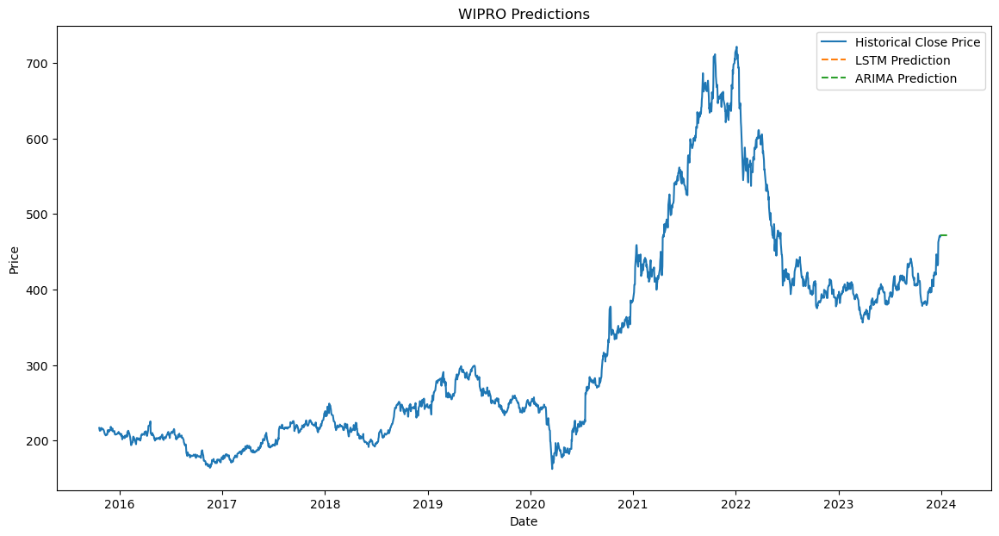

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

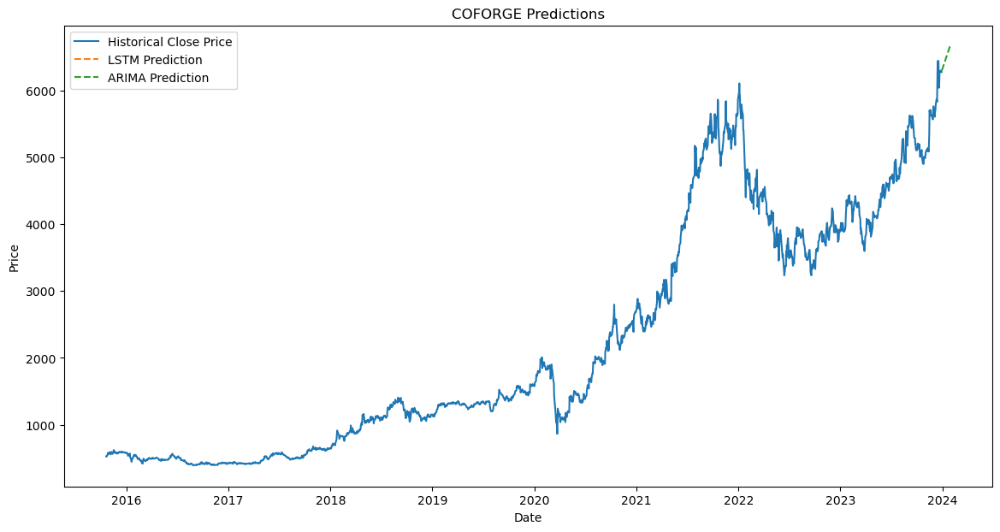

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

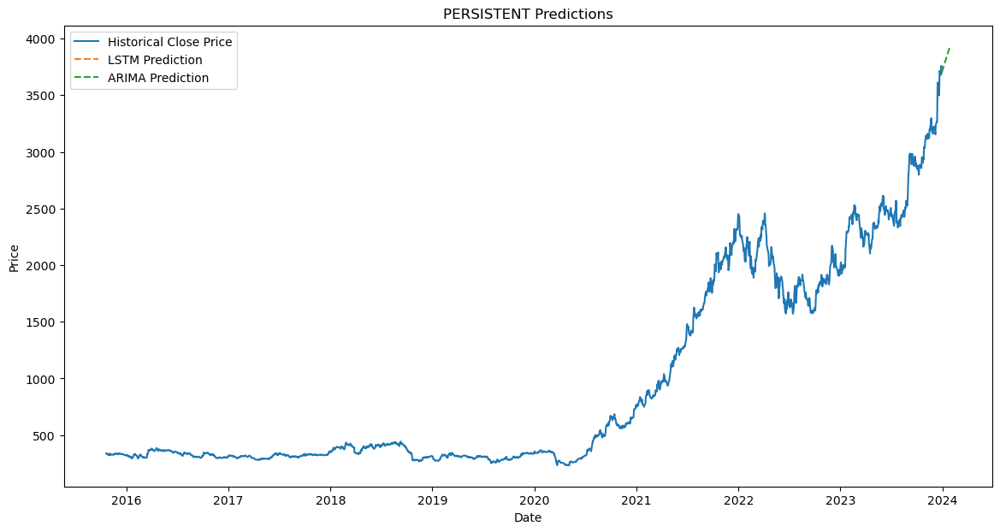

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 502us/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

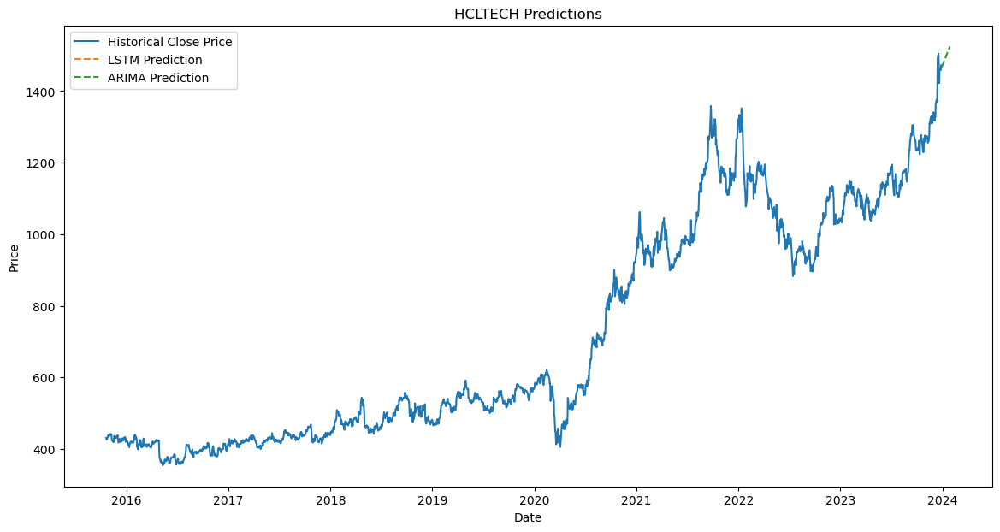

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

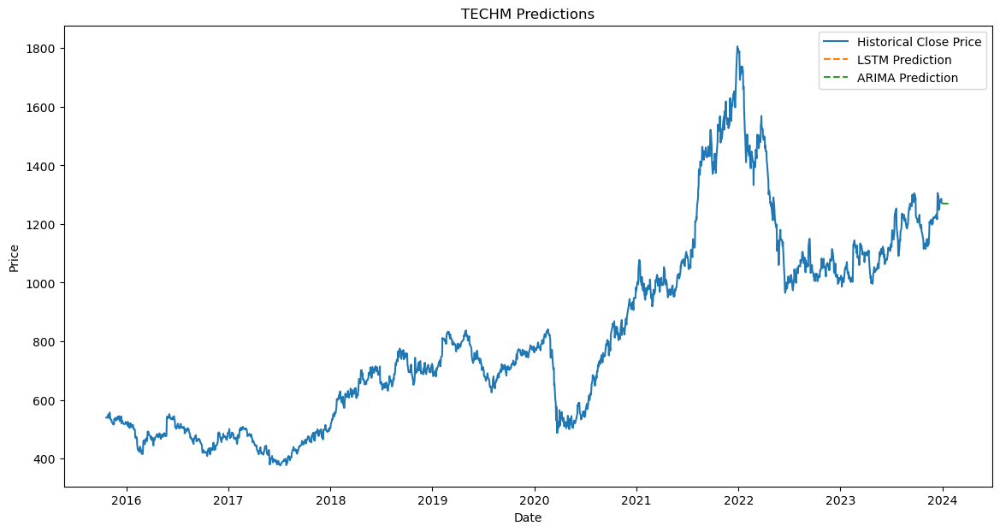

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],


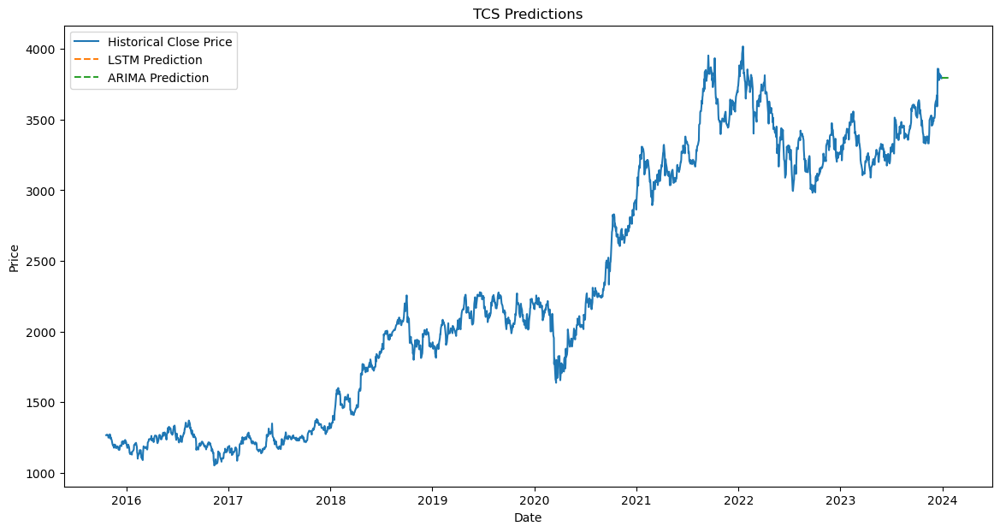

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],


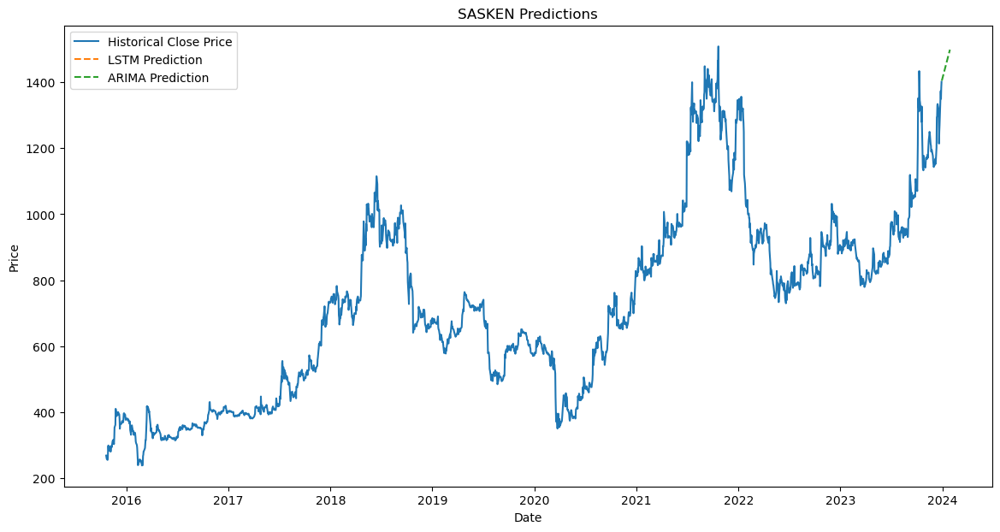

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

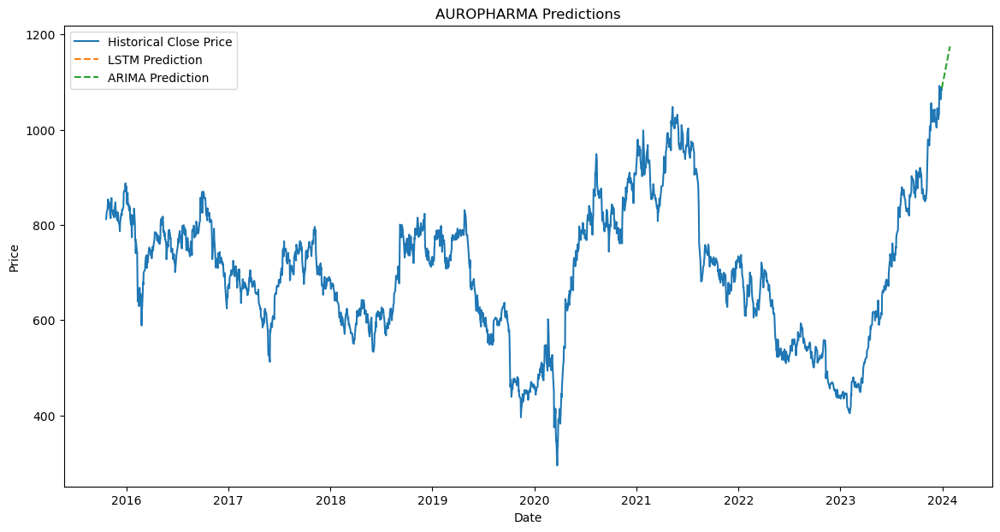

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

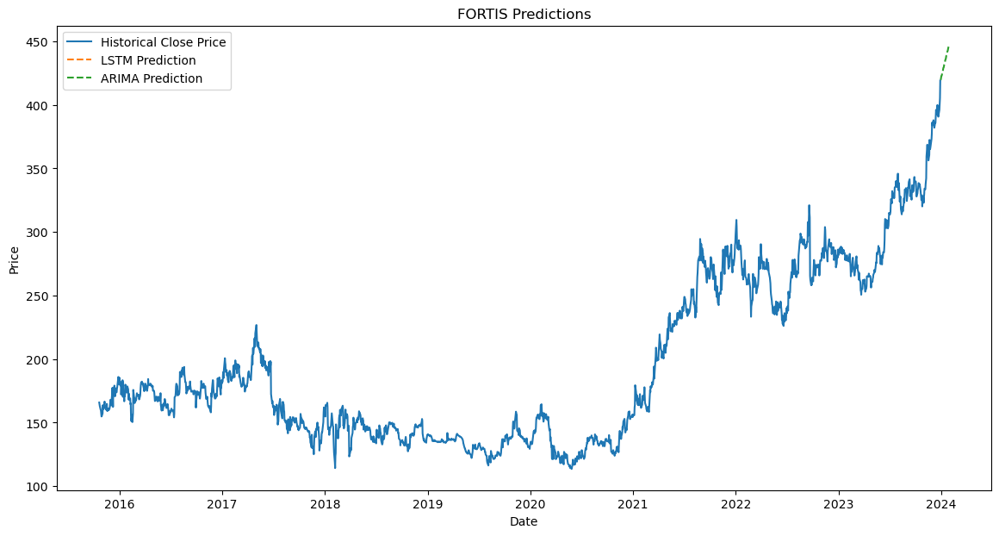

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

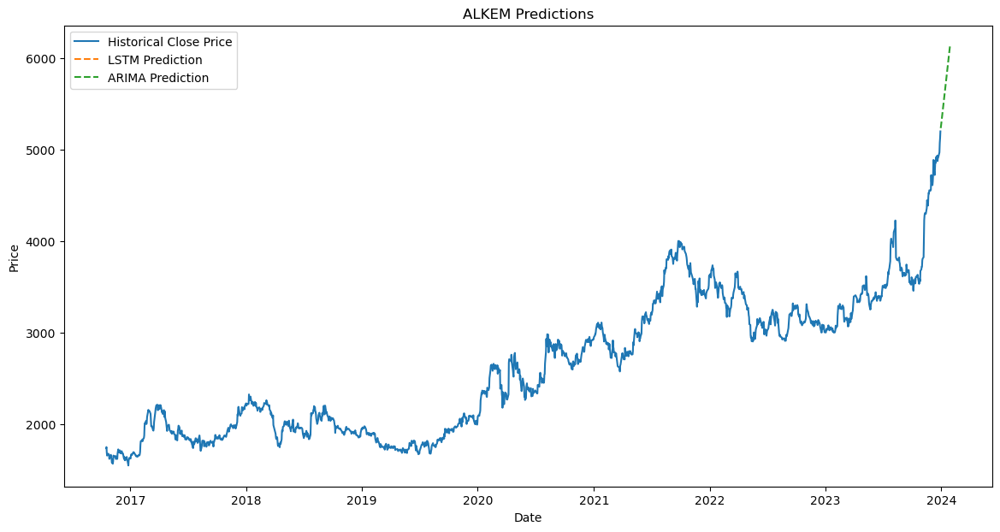

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

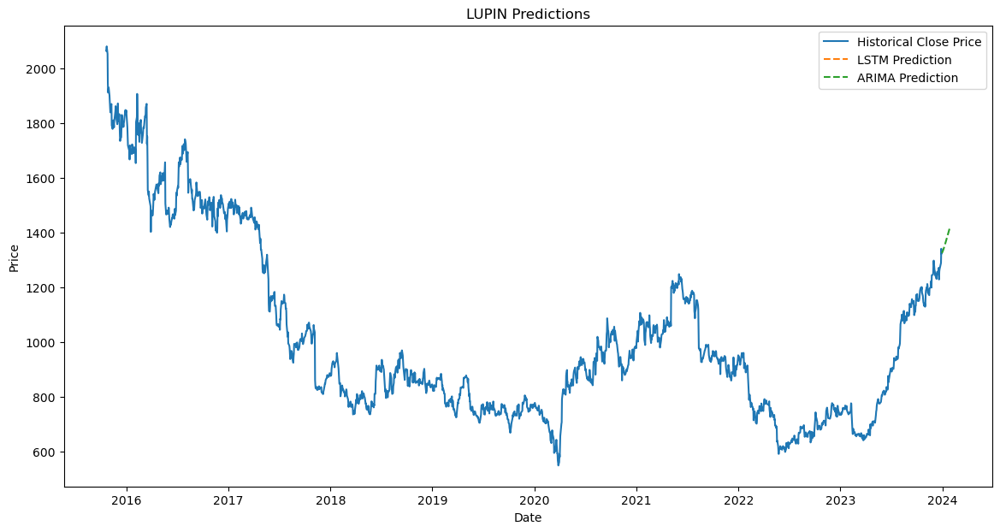

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

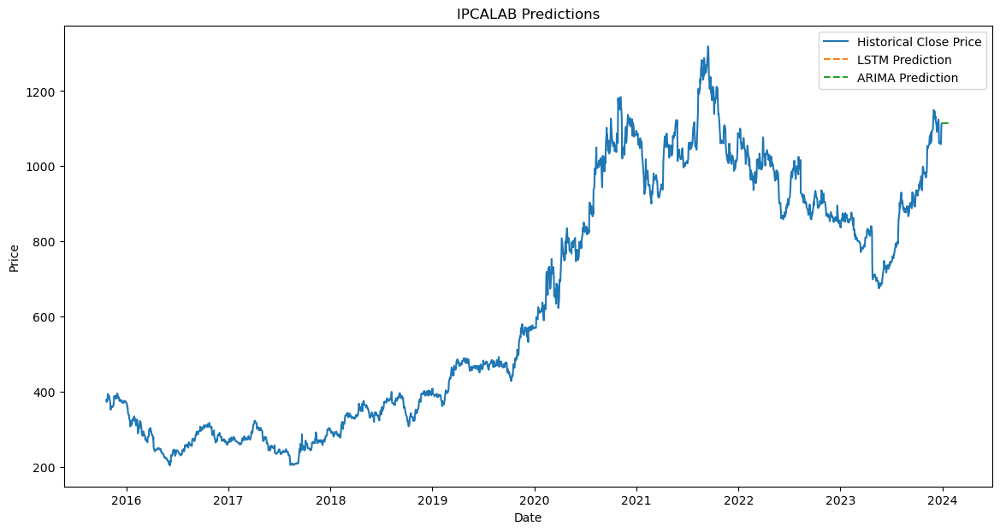

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

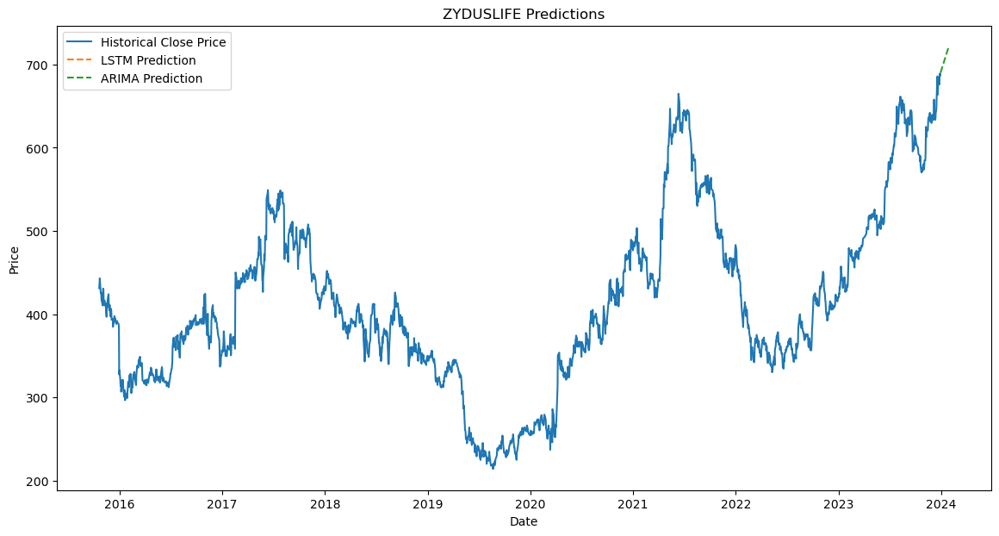

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

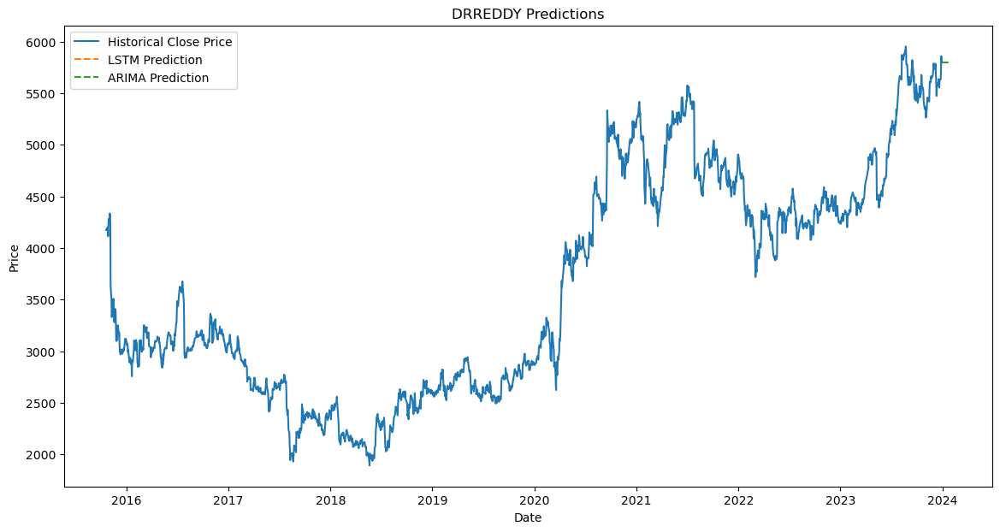

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

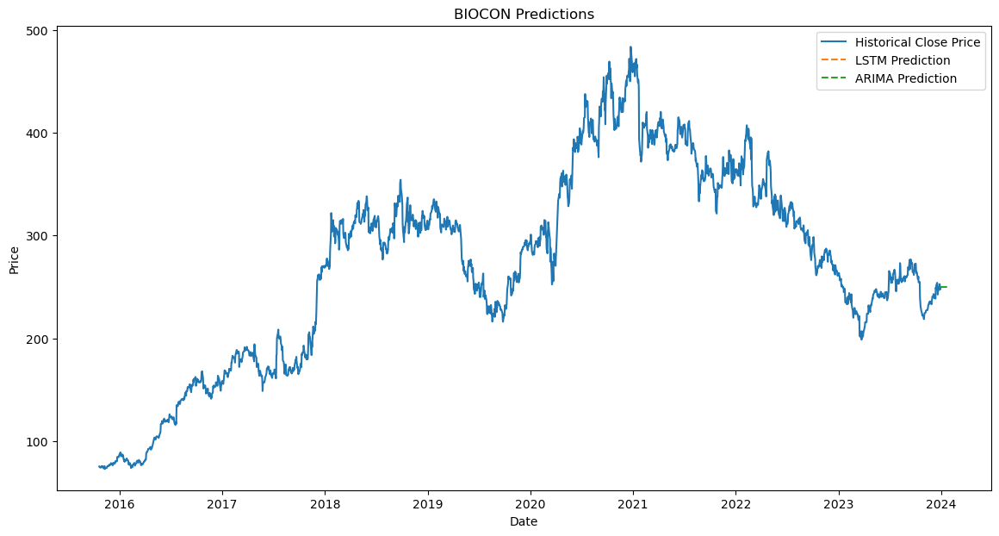

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

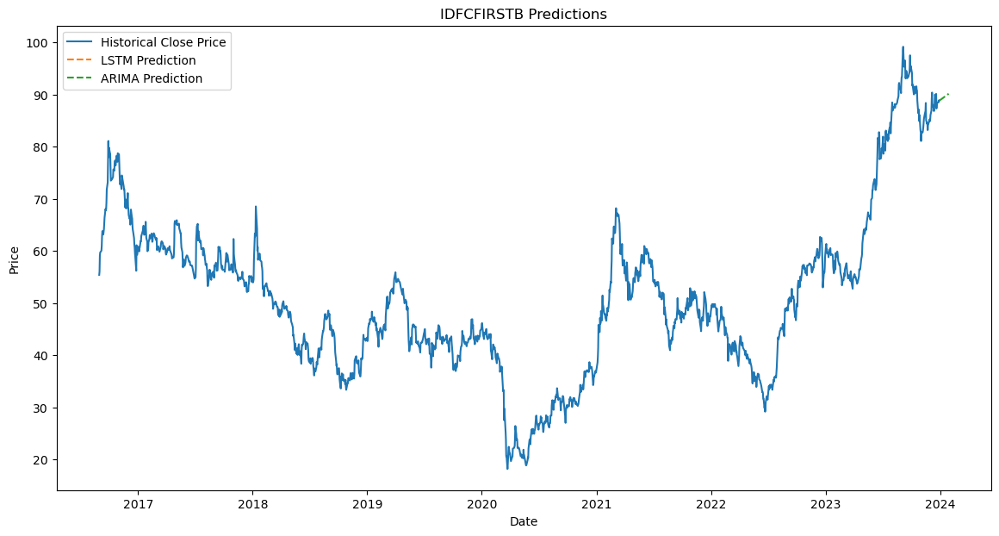

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

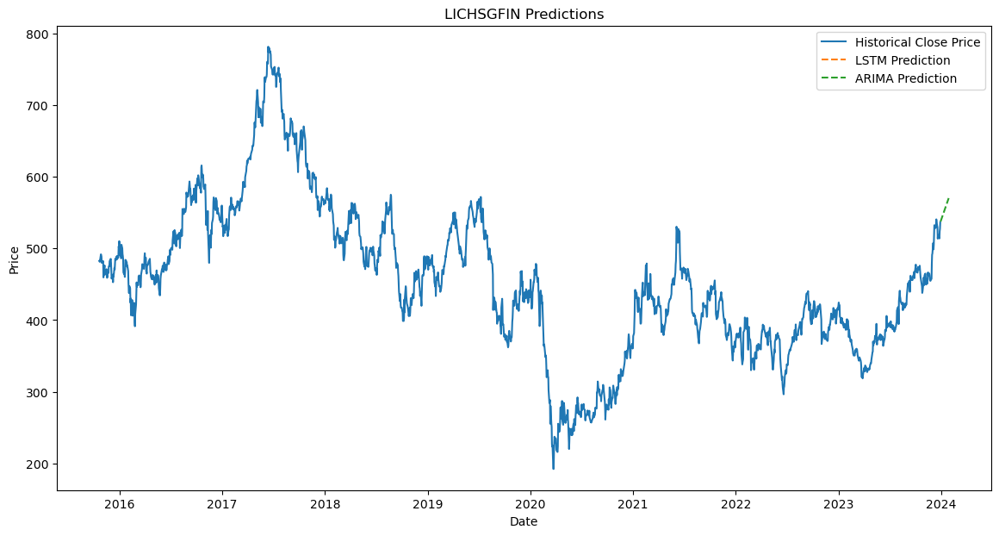

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

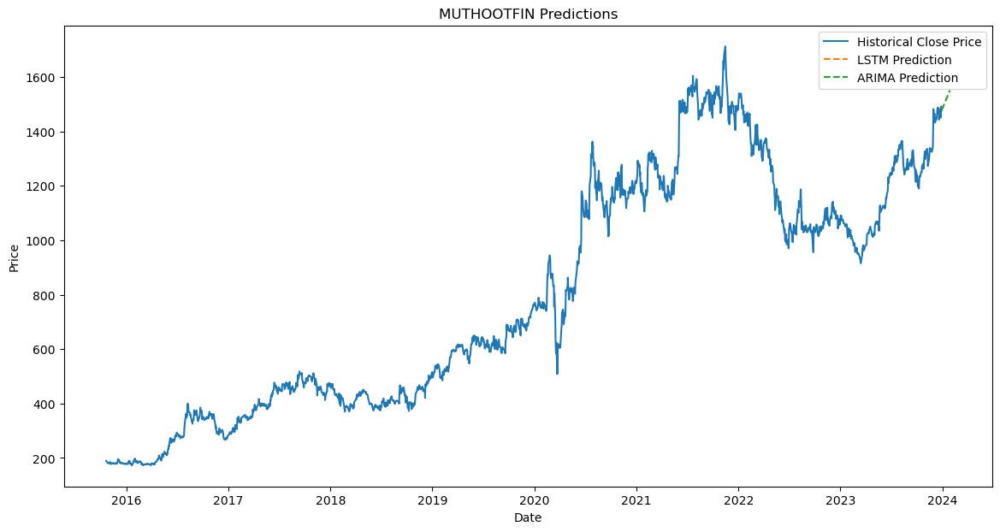

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],


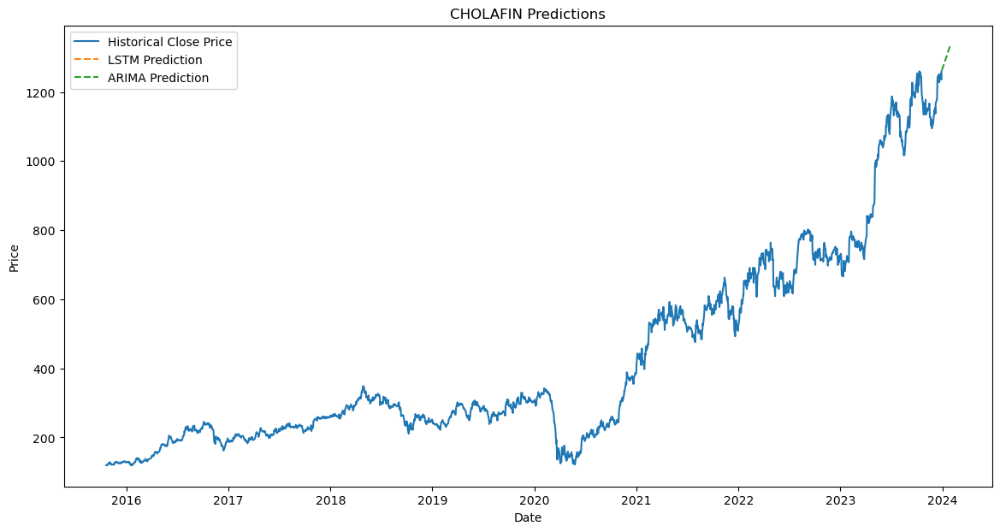

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

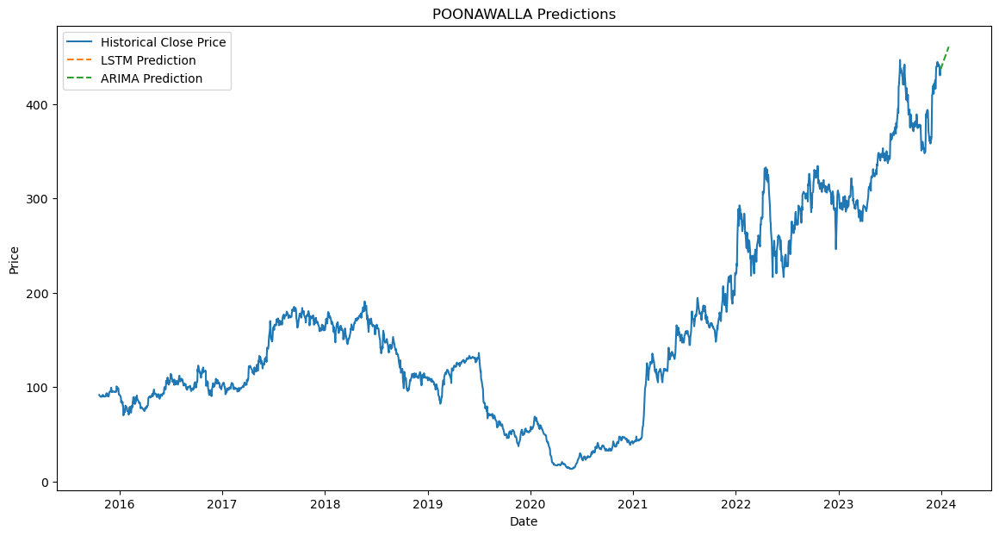

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

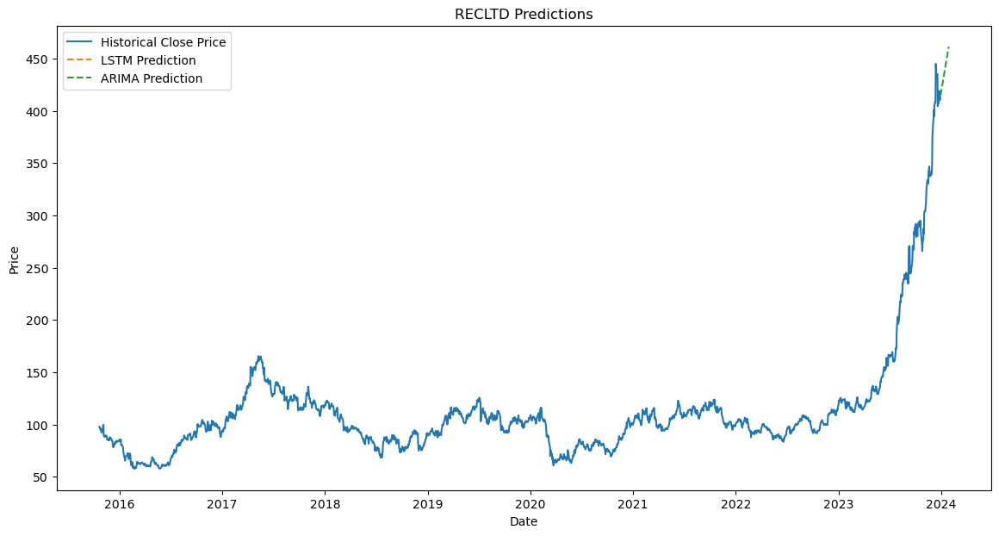

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:17: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\yashv\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD': talib.MACD(latest_data['Close'])[-1][0],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:92: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\90085101.py:91: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos

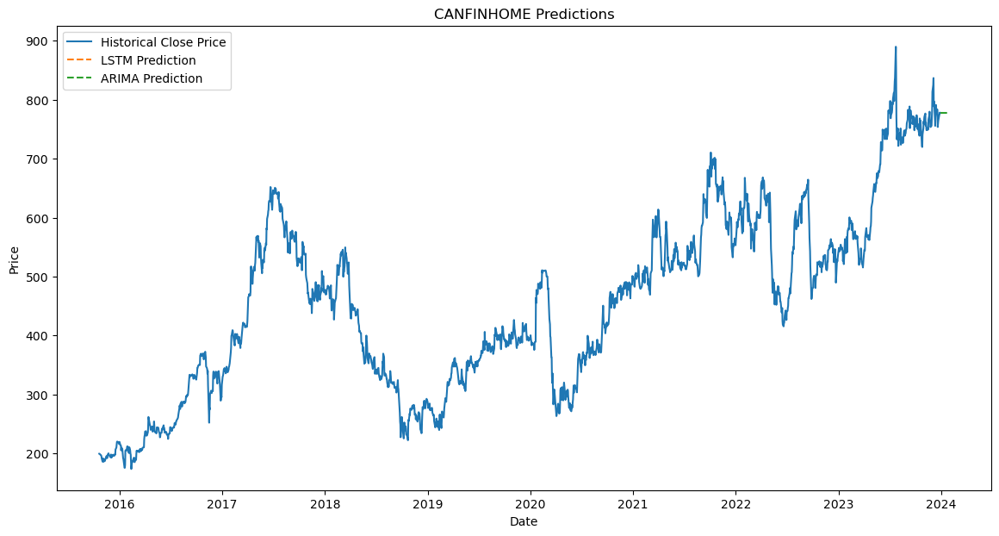

   Stock       Date  LSTM_Prediction  ARIMA_Prediction
0  WIPRO 2023-12-30       475.976089        471.681958
1  WIPRO 2023-12-31              NaN        471.681958
2  WIPRO 2024-01-01              NaN        471.681958
3  WIPRO 2024-01-02              NaN        471.681958
4  WIPRO 2024-01-03              NaN        471.681958


In [16]:
# Combine all sectors into a single list
all_stocks = it_stocks + healthcare_stocks + banking_stocks

# Initialize an empty DataFrame to store all predictions
newstoredvalue = pd.DataFrame(columns=['Stock', 'Date', 'LSTM_Prediction', 'ARIMA_Prediction'])

def arima_lstm_prediction(stock_name, file_path):
    # Load the stock data
    data = pd.read_csv(file_path)
    
    # Ensure the 'Date' column is in datetime format and set as index
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index('Date', inplace=True)

    # Fill missing values using forward and backward fill
    data.fillna(method='bfill', inplace=True)
    data.fillna(method='ffill', inplace=True)

    # Calculate technical indicators
    data['SMA50'] = data['Close'].rolling(window=50).mean()
    data['SMA200'] = data['Close'].rolling(window=200).mean()
    data['EMA50'] = data['Close'].ewm(span=50, adjust=False).mean()
    data['EMA200'] = data['Close'].ewm(span=200, adjust=False).mean()
    data['MACD'], data['MACD_Signal'], _ = talib.MACD(data['Close'])
    data['Bollinger_High'] = data['SMA50'] + (data['Close'].rolling(window=50).std() * 2)
    data['Bollinger_Low'] = data['SMA50'] - (data['Close'].rolling(window=50).std() * 2)

    # Drop any remaining NaN values
    data.fillna(method='ffill', inplace=True)
    data.dropna(inplace=True)

    # Scale the features
    features = ['Close', 'SMA50', 'SMA200', 'EMA50', 'EMA200', 'MACD', 'MACD_Signal', 'Bollinger_High', 'Bollinger_Low']
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data[features])

    # Prepare data for LSTM
    time_steps = 5

    def create_sequences(data, time_steps):
        X, y = [], []
        for i in range(len(data) - time_steps):
            X.append(data[i:i + time_steps])
            y.append(data[i + time_steps, 0])  # Only the 'Close' price for y
        return np.array(X), np.array(y)

    X, y = create_sequences(scaled_data, time_steps)

    # Reshape X for LSTM input
    X = X.reshape((X.shape[0], X.shape[1], len(features)))

    # Build the LSTM model
    model_lstm = Sequential()
    model_lstm.add(LSTM(50, return_sequences=True, input_shape=(time_steps, len(features))))
    model_lstm.add(Dropout(0.2))
    model_lstm.add(LSTM(50))
    model_lstm.add(Dropout(0.2))
    model_lstm.add(Dense(1))  # Output layer for closing price

    # Compile the model
    model_lstm.compile(optimizer='adam', loss='mean_squared_error')

    # Train the LSTM model
    model_lstm.fit(X, y, epochs=50, batch_size=16, verbose=0)

    # Use ARIMA for trend predictions
    train_data = data['Close'].tail(180)
    model_arima = auto_arima(train_data, seasonal=False, stepwise=True, trace=False)
    arima_future_pred = model_arima.predict(n_periods=30)

    # Prepare LSTM for future predictions
    X_test = scaled_data[-time_steps:].reshape(1, time_steps, len(features))
    lstm_future_pred = []

    for i in range(30):  # Predict the next 30 days based on LSTM
        next_prediction = model_lstm.predict(X_test)
        lstm_future_pred.append(next_prediction[0, 0])

        # Recalculate technical indicators for the next prediction
        latest_data = data.iloc[-time_steps:].copy()
        next_date = latest_data.index[-1] + pd.Timedelta(days=1)
        next_close_price = next_prediction[0, 0]

        # Update the latest data with the new predicted close price
        next_row = pd.Series({
            'Close': next_close_price,
            'SMA50': latest_data['Close'].rolling(window=50).mean().iloc[-1],
            'SMA200': latest_data['Close'].rolling(window=200).mean().iloc[-1],
            'EMA50': latest_data['Close'].ewm(span=50, adjust=False).mean().iloc[-1],
            'EMA200': latest_data['Close'].ewm(span=200, adjust=False).mean().iloc[-1],
            'MACD': talib.MACD(latest_data['Close'])[-1][0],
            'MACD_Signal': talib.MACD(latest_data['Close'])[-1][1],
            'Bollinger_High': latest_data['SMA50'].iloc[-1] + (latest_data['Close'].rolling(window=50).std().iloc[-1] * 2),
            'Bollinger_Low': latest_data['SMA50'].iloc[-1] - (latest_data['Close'].rolling(window=50).std().iloc[-1] * 2)
        }, name=next_date)

        # Use pd.concat to add the new row
        latest_data = pd.concat([latest_data, next_row.to_frame().T])

        # Recalculate technical indicators for scaling
        latest_scaled = scaler.transform(latest_data[features])[-1].reshape(1, 1, len(features))
        X_test = np.append(X_test[:, 1:, :], latest_scaled, axis=1)

    # Create a dummy array for inverse transform
    dummy_array = np.zeros((len(lstm_future_pred), len(features)))  # Shape must match the original features
    dummy_array[:, 0] = lstm_future_pred  # Set the first column to the LSTM predictions

    # Inverse transform the LSTM predictions back to original scale
    lstm_future_pred_rescaled = scaler.inverse_transform(dummy_array)[:, 0]  # Extract only the closing prices

    # Combine predictions
    dates = pd.date_range(start=data.index[-1] + pd.Timedelta(days=1), periods=30)
    prediction_df = pd.DataFrame({
        'Date': dates,
        'LSTM_Prediction': lstm_future_pred_rescaled,
        'ARIMA_Prediction': np.concatenate((arima_future_pred, [None] * (30 - len(arima_future_pred))))
    })

    # Store the predictions in newstoredvalue DataFrame using pd.concat
    predictions_to_add = pd.DataFrame({
        'Stock': stock_name,
        'Date': prediction_df['Date'],
        'LSTM_Prediction': prediction_df['LSTM_Prediction'],
        'ARIMA_Prediction': prediction_df['ARIMA_Prediction']
    })

    global newstoredvalue
    newstoredvalue = pd.concat([newstoredvalue, predictions_to_add], ignore_index=True)

    # Plotting the predictions
    plt.figure(figsize=(14, 7))
    plt.plot(data['Close'], label='Historical Close Price')
    plt.plot(prediction_df['Date'], prediction_df['LSTM_Prediction'], label='LSTM Prediction', linestyle='--')
    plt.plot(prediction_df['Date'], prediction_df['ARIMA_Prediction'], label='ARIMA Prediction', linestyle='--')
    plt.title(f'{stock_name} Predictions')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

# Execute prediction for all stocks
for stock_name, file_path in all_stocks:
    arima_lstm_prediction(stock_name, file_path)

# Show the final stored predictions
print(newstoredvalue.head())


CALCULATION OF TOP 3 STOCKS FROM EACH 3 SECTOR AND CREATING A BASKET BY ANALYZING THE TECHINCAL INDICATOR AND PREDICTION MODEL

In [28]:
print(newstoredvalue.head(50))

      Stock       Date  LSTM_Prediction  ARIMA_Prediction
0     WIPRO 2023-12-30       475.976089        471.681958
1     WIPRO 2023-12-31              NaN        471.681958
2     WIPRO 2024-01-01              NaN        471.681958
3     WIPRO 2024-01-02              NaN        471.681958
4     WIPRO 2024-01-03              NaN        471.681958
5     WIPRO 2024-01-04              NaN        471.681958
6     WIPRO 2024-01-05              NaN        471.681958
7     WIPRO 2024-01-06              NaN        471.681958
8     WIPRO 2024-01-07              NaN        471.681958
9     WIPRO 2024-01-08              NaN        471.681958
10    WIPRO 2024-01-09              NaN        471.681958
11    WIPRO 2024-01-10              NaN        471.681958
12    WIPRO 2024-01-11              NaN        471.681958
13    WIPRO 2024-01-12              NaN        471.681958
14    WIPRO 2024-01-13              NaN        471.681958
15    WIPRO 2024-01-14              NaN        471.681958
16    WIPRO 20

In [20]:

# Function to calculate cumulative return
def calculate_cumulative_return(stock_data):
    predicted_values = np.array(stock_data)  
    if len(predicted_values) > 1:  
        P_start = predicted_values[0]
        P_end = predicted_values[-1]
        cumulative_return = (P_end - P_start) / P_start
    else:
        cumulative_return = 0  
    return cumulative_return

# Function to calculate volatility (standard deviation of predicted values)
def calculate_volatility(stock_data):
    predicted_values = np.array(stock_data)
    if len(predicted_values) > 1:
        volatility = np.std(predicted_values)
    else:
        volatility = 0
    return volatility

# Function to calculate Sharpe Ratio (risk-adjusted return)
def calculate_sharpe_ratio(stock_data):
    predicted_values = np.array(stock_data)
    if len(predicted_values) > 1:
        daily_returns = np.diff(predicted_values) / predicted_values[:-1]  
        average_return = np.mean(daily_returns)
        volatility = np.std(predicted_values)
        sharpe_ratio = average_return / volatility if volatility != 0 else 0
    else:
        sharpe_ratio = 0
    return sharpe_ratio

# Function to calculate future profit from 30-day predictions
def calculate_future_profit(stock_data, future_values):
    predicted_values = np.array(stock_data)
    if len(predicted_values) > 0:  
        P_last = predicted_values[-1]  
        P_future = np.mean(future_values)  
        future_profit = P_future - P_last
    else:
        future_profit = 0
    return future_profit

# Initialize an empty DataFrame to store the analysis
stock_analysis = pd.DataFrame(columns=['Stock', 'Sector', 'Cumulative_Return', 'Volatility', 'Sharpe_Ratio', 'Future_Profit'])

# Function to perform the analysis for a stock
def analyze_stock(stock_name, stock_data, future_values, sector):
    cumulative_return = calculate_cumulative_return(stock_data)
    volatility = calculate_volatility(stock_data)
    sharpe_ratio = calculate_sharpe_ratio(stock_data)
    future_profit = calculate_future_profit(stock_data, future_values)
    
    # Append analysis to the DataFrame
    stock_analysis.loc[len(stock_analysis)] = [stock_name, sector, cumulative_return, volatility, sharpe_ratio, future_profit]

# Perform analysis for each stock in the savedoldvalue DataFrame
for stock_name in savedoldvalue['Stock'].unique():
    # Get the historical predicted values for this stock from savedoldvalue
    stock_data = savedoldvalue[savedoldvalue['Stock'] == stock_name]['Predicted_Value'].values[0]  
    
    # Get the future values for the stock from the newstoredvalue (mean of LSTM and ARIMA predictions)
    future_values = newstoredvalue[newstoredvalue['Stock'] == stock_name][['LSTM_Prediction', 'ARIMA_Prediction']].mean(axis=1).values
    
    # Determine the sector of the stock
    if stock_name in [stock[0] for stock in it_stocks]:
        sector = 'IT'
    elif stock_name in [stock[0] for stock in healthcare_stocks]:
        sector = 'Healthcare'
    else:
        sector = 'Banking'
    
    # Analyze the stock using all parameters
    analyze_stock(stock_name, stock_data, future_values, sector)

# Rank stocks within each sector based on future profit, cumulative return, and Sharpe ratio
def rank_stocks_by_sector(sector):
    sector_stocks = stock_analysis[stock_analysis['Sector'] == sector]
    sector_stocks['Score'] = (0.4 * sector_stocks['Future_Profit'] + 
                              0.3 * sector_stocks['Cumulative_Return'] + 
                              0.3 * sector_stocks['Sharpe_Ratio'])  # Weighted score
    top_3_stocks = sector_stocks.sort_values(by='Score', ascending=False).head(3)
    return top_3_stocks

# Get the top 3 stocks for each sector
top_it_stocks = rank_stocks_by_sector('IT')
top_healthcare_stocks = rank_stocks_by_sector('Healthcare')
top_banking_stocks = rank_stocks_by_sector('Banking')

# Display the top stocks in each sector
print("Top 3 IT Stocks:")
print(top_it_stocks[['Stock', 'Cumulative_Return', 'Volatility', 'Sharpe_Ratio', 'Future_Profit', 'Score']])

print("\nTop 3 Healthcare Stocks:")
print(top_healthcare_stocks[['Stock', 'Cumulative_Return', 'Volatility', 'Sharpe_Ratio', 'Future_Profit', 'Score']])

print("\nTop 3 Banking Stocks:")
print(top_banking_stocks[['Stock', 'Cumulative_Return', 'Volatility', 'Sharpe_Ratio', 'Future_Profit', 'Score']])


Top 3 IT Stocks:
        Stock  Cumulative_Return  Volatility  Sharpe_Ratio  Future_Profit  \
1     COFORGE           0.574301  589.899209      0.000005     206.058793   
6      SASKEN           0.747513  166.395775      0.000022      64.415418   
2  PERSISTENT           0.745800  382.563496      0.000009      45.070074   

       Score  
1  82.595809  
6  25.990428  
2  18.251772  

Top 3 Healthcare Stocks:
        Stock  Cumulative_Return  Volatility  Sharpe_Ratio  Future_Profit  \
9       ALKEM           0.466352  490.063554      0.000005     524.223248   
7  AUROPHARMA           0.903087  143.161186      0.000027      38.065143   
8      FORTIS           0.528164   36.375513      0.000070      26.767706   

        Score  
9  209.829206  
7   15.496991  
8   10.865553  

Top 3 Banking Stocks:
        Stock  Cumulative_Return  Volatility  Sharpe_Ratio  Future_Profit  \
18   CHOLAFIN           0.467634   97.399663      0.000024      55.349469   
20     RECLTD           2.261968   90.

C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\1999795829.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sector_stocks['Score'] = (0.4 * sector_stocks['Future_Profit'] +
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\1999795829.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sector_stocks['Score'] = (0.4 * sector_stocks['Future_Profit'] +
C:\Users\yashv\AppData\Local\Temp\ipykernel_20624\1999795829.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

CREATING A STOCK BASKET OF TOP 2 STOCK FROM EACH SECTOR BY GIVING WEIGHTAGE OF 805 TO HISTORICAL PREDICTED VALUE AND 20 % TO FUTURE PREDICTED VALUE

Enter your total investment amount:  100000


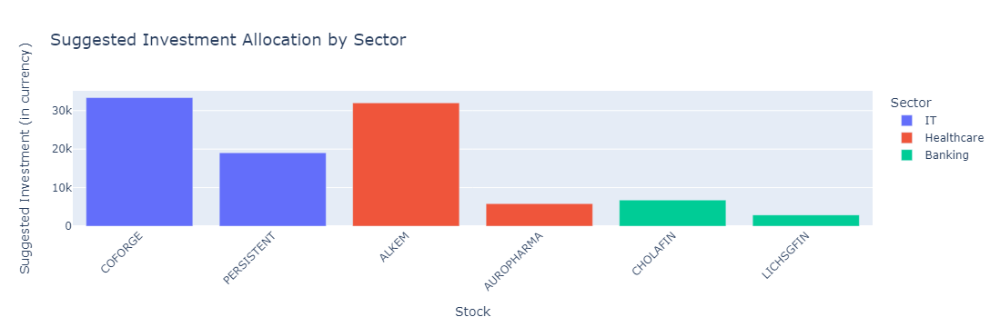

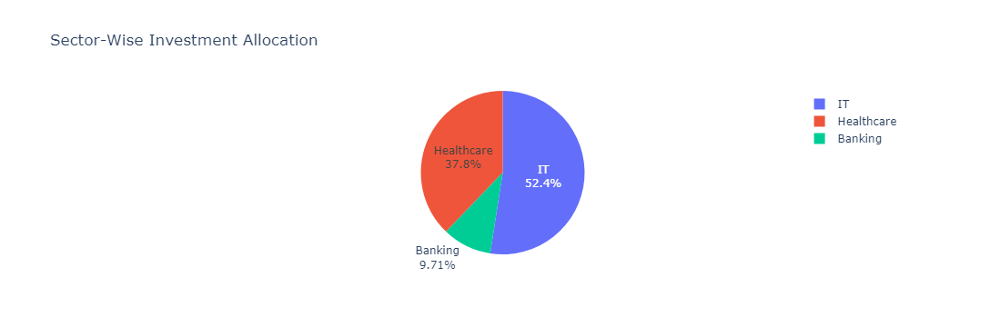


Investment Suggestions for Top Stocks:
        Stock      Sector  Investment_Suggestion
0     COFORGE          IT           33374.492980
2  PERSISTENT          IT           19067.376669
0       ALKEM  Healthcare           31996.573036
1  AUROPHARMA  Healthcare            5851.538141
0    CHOLAFIN     Banking            6795.039620
2   LICHSGFIN     Banking            2914.979554


In [22]:
# Function to calculate weighted score (80% historical, 20% future)
def calculate_weighted_score(past_score, future_score):
    return 0.8 * past_score + 0.2 * future_score

# Function to suggest investment allocation based on score
def suggest_investment(allocation_amount, stock_scores):
    total_score = stock_scores['Weighted_Score'].sum()
    stock_scores['Investment_Suggestion'] = (stock_scores['Weighted_Score'] / total_score) * allocation_amount
    return stock_scores

# Function to perform analysis for a sector and select top 2 stocks
def analyze_sector_top_n(sector_name, sector_top_n, newstoredvalue, top_n=2):
    combined_analysis = pd.DataFrame(columns=['Stock', 'Weighted_Score', 'Sector'])

    for stock_name in sector_top_n['Stock'].values:
        # Get historical score
        historical_score = sector_top_n[sector_top_n['Stock'] == stock_name]['Score'].values[0]

        # Get future predictions for the stock (LSTM + ARIMA average)
        future_predictions = newstoredvalue[newstoredvalue['Stock'] == stock_name][['LSTM_Prediction', 'ARIMA_Prediction']].mean(axis=1).values

        # Calculate the future score (mean of future predictions)
        future_score = np.mean(future_predictions)

        # Calculate the weighted score
        weighted_score = calculate_weighted_score(historical_score, future_score)

        # Append the weighted score and sector to the combined DataFrame
        combined_analysis.loc[len(combined_analysis)] = [stock_name, weighted_score, sector_name]

    # Sort by weighted score and return top N stocks from this sector
    combined_analysis = combined_analysis.sort_values(by='Weighted_Score', ascending=False).head(top_n)
    
    return combined_analysis

# Function to visualize investment suggestions using Plotly (Bar Chart)
def visualize_investment_suggestions_plotly(top_stocks):
    # Ensure that sector names are treated as categorical variables
    top_stocks['Sector'] = top_stocks['Sector'].astype(str) 
    
    fig = px.bar(top_stocks, x='Stock', y='Investment_Suggestion', color='Sector', 
                 title="Suggested Investment Allocation by Sector", 
                 labels={'Investment_Suggestion': 'Investment Amount'}, 
                 hover_data=['Weighted_Score'])
    
    # Update layout for better readability
    fig.update_layout(xaxis_title="Stock", 
                      yaxis_title="Suggested Investment (in currency)", 
                      title_font_size=18, 
                      legend_title="Sector",
                      xaxis_tickangle=-45) 
                      
    fig.show()

# Function to visualize sector-wise distribution using Plotly (Pie Chart)
def visualize_sector_distribution_pie(top_stocks):
    # Aggregate investment suggestions by sector
    sector_distribution = top_stocks.groupby('Sector')['Investment_Suggestion'].sum().reset_index()

    # Create a pie chart
    fig = px.pie(sector_distribution, names='Sector', values='Investment_Suggestion', 
                 title="Sector-Wise Investment Allocation", 
                 hover_data=['Investment_Suggestion'], labels={'Investment_Suggestion': 'Investment Amount'})
    
    # Show the pie chart
    fig.update_traces(textinfo='percent+label') 
    fig.show()

# Main analysis for top stocks across all sectors
def analyze_and_visualize(investment_amount, top_it_stocks, top_healthcare_stocks, top_banking_stocks, newstoredvalue):
    # Analyze top stocks from each sector, but limit to 2 stocks per sector
    it_analysis = analyze_sector_top_n('IT', top_it_stocks, newstoredvalue, top_n=2)
    healthcare_analysis = analyze_sector_top_n('Healthcare', top_healthcare_stocks, newstoredvalue, top_n=2)
    banking_analysis = analyze_sector_top_n('Banking', top_banking_stocks, newstoredvalue, top_n=2)

    # Combine all top stocks from different sectors
    all_top_stocks = pd.concat([it_analysis, healthcare_analysis, banking_analysis])

    # Suggest investments based on weighted scores
    top_stocks = suggest_investment(investment_amount, all_top_stocks)

    # Visualize investment suggestions (Bar Chart)
    visualize_investment_suggestions_plotly(top_stocks)

    # Visualize sector-wise investment distribution (Pie Chart)
    visualize_sector_distribution_pie(top_stocks)

    return top_stocks

# Example: Assuming user input for total investment amount
investment_amount = float(input("Enter your total investment amount: "))

# Call the main function to perform analysis and visualization
top_stocks = analyze_and_visualize(investment_amount, 
                                    top_it_stocks, 
                                    top_healthcare_stocks, 
                                    top_banking_stocks, 
                                    newstoredvalue)

# Display final results
print("\nInvestment Suggestions for Top Stocks:")
print(top_stocks[['Stock', 'Sector', 'Investment_Suggestion']])


RESULT - HERE WE CAN OBSERVE THAT IF A USER PROMPT A INVESTMENT OF Rs 10,00,000 , THE MODEL WILL ANALYZE THE HISTORICAL AS WELL AS FUTURE 30 DAYS PREDICTED VALUE AND SUGGEST THE INVESTMENGT ON THE BASIS OF PROFIT WHHICH WILL BE CALCULATED THROUGH VARIOUS TECHINCAL FACRTOR AND PREDICION VALUES AND IN RESULT WE GET THE TOP 3 STOCKS FROM EACH SECTOR WITH THE RATIO OF INVESTMENET AMOUNT